# Predictive Asthma Modeling

The objective of this workbook is to: 

- Collect and clean three datasets (asthma prevalence, social vulnerability indices, and air quality metrics). 

- Perform exploratory data analytics (EDA).

- Unsupervised modeling for feature engineering and data dimension reduction. 

- Supervised modeling for predicted asthma prevalence by census tract using the clustered features from the unsupervised model.

- Visualizations of final output and model. 

### Import All Necessary Libraries

Uncomment the following line to install the required libraries

In [1]:
#!pip install -r requirements.txt

Import all necessary libraries

In [2]:
import requests
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,mean_absolute_error, r2_score, make_scorer
from sklearn.neighbors import kneighbors_graph
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, KFold, cross_validate, learning_curve
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

import networkx as nx
from networkx.algorithms.community import modularity


from xgboost import XGBRegressor

from scipy.stats import zscore

import shap

import plotly.express as px
from urllib.request import urlopen
import json

import gc

/root/venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Data Collection and Cleaning

### Load and Inspect Data

PLACES data: https://data.cdc.gov/500-Cities-Places/PLACES-Local-Data-for-Better-Health-Census-Tract-D/cwsq-ngmh/about_data

In [3]:
# Load API data
url = "https://data.cdc.gov/resource/cwsq-ngmh.json"  # CDC API URL
params = {
    "$limit": 1000000,  # Increase limit to load all data
    "year": "2022",
    "measure": "Current asthma among adults"
}
response = requests.get(url, params=params)
data = response.json()

# Convert to a pandas DataFrame
asthma_df = pd.DataFrame(data)

# Keep only the required columns
asthma_df = asthma_df[['stateabbr', 'statedesc', 'countyname', 'locationname', 'data_value']]
asthma_df.rename(columns={'data_value': 'asthma_prevalence'}, inplace=True)
asthma_df['asthma_prevalence'] = pd.to_numeric(asthma_df['asthma_prevalence'], errors='coerce') / 100

# Display the dataframe
asthma_df

,stateabbr,statedesc,countyname,locationname,asthma_prevalence
0,FL,Florida,Miami-Dade,12086009907,0.100
1,FL,Florida,Miami-Dade,12086003705,0.076
2,FL,Florida,Miami-Dade,12086011800,0.086
3,FL,Florida,Miami-Dade,12086012101,0.090
4,FL,Florida,Miami-Dade,12086007705,0.078
...,...,...,...,...,...
83517,FL,Florida,Marion,12083001208,0.101
83518,FL,Florida,Marion,12083001205,0.094
83519,FL,Florida,Manatee,12081002003,0.094
83520,FL,Florida,Leon,12073000303,0.124


States by region stripped from: https://www2.census.gov/geo/pdfs/maps-data/maps/reference/us_regdiv.pdf

In [4]:
region_df = pd.read_csv("Region.csv")
region_df

,StateAbbr,Region
0,AL,South
1,AZ,West
2,AR,South
3,CA,West
4,CO,West
5,CT,Northeast
6,DE,South
7,DC,South
8,FL,South
9,GA,South


SVI data: https://www.atsdr.cdc.gov/place-health/php/svi/svi-data-documentation-download.html

In [5]:
# Load the SVI dataset
data_file = 'SVI_2022_US.csv'
svi_df = pd.read_csv(data_file)

# Drop the first five columns, the seventh column, and the eighth column from svi_df
columns_to_drop = svi_df.columns[:5].tolist() + [svi_df.columns[6], svi_df.columns[7]]
svi_df = svi_df.drop(columns=columns_to_drop)

# Drop redundant columns, such as totals, margin of error, percentiles, etc...
prefixes = ("E_", "EPL_", "SPL_", "RPL_", "F_", "M_", "MP_")
svi_df = svi_df.drop(columns=[col for col in svi_df.columns if col.startswith(prefixes)])

# Display the dataframe
svi_df

,FIPS,EP_POV150,EP_UNEMP,EP_HBURD,EP_NOHSDP,EP_UNINSUR,EP_AGE65,EP_AGE17,EP_DISABL,EP_SNGPNT,...,EP_NOVEH,EP_GROUPQ,EP_NOINT,EP_AFAM,EP_HISP,EP_ASIAN,EP_AIAN,EP_NHPI,EP_TWOMORE,EP_OTHERRACE
0,1001020100,21.6,2.6,17.9,16.2,8.2,19.5,24.0,20.1,4.9,...,4.6,0.0,8.1,11.2,4.3,2.4,0.0,0.0,5.5,0.0
1,1001020200,14.3,5.5,17.5,8.7,7.8,15.7,9.9,20.4,0.7,...,7.9,9.9,21.5,56.0,0.1,0.0,0.0,0.0,7.3,0.4
2,1001020300,22.2,1.9,24.0,10.6,5.1,13.5,26.2,16.0,8.5,...,3.7,0.2,10.3,25.1,1.3,0.3,0.0,0.0,4.2,0.0
3,1001020400,12.9,0.9,13.1,7.3,4.4,26.0,14.6,22.3,3.7,...,6.4,0.0,6.2,7.4,1.1,0.6,0.2,0.0,2.9,0.0
4,1001020501,10.0,0.6,26.5,7.6,6.2,13.4,18.1,17.7,4.0,...,1.7,0.3,1.3,15.0,3.7,2.4,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84115,56043000200,16.2,1.9,24.6,3.6,11.4,21.1,20.6,10.7,2.5,...,3.4,1.6,14.2,0.0,6.4,0.6,0.3,0.0,2.0,0.1
84116,56043000301,21.3,0.4,21.8,11.7,13.6,18.5,29.0,13.2,6.6,...,7.1,1.2,18.6,0.0,24.7,0.0,0.3,0.0,2.6,0.8
84117,56043000302,20.8,2.9,19.3,2.2,9.7,30.9,16.5,17.5,0.3,...,4.3,3.4,10.3,0.0,14.2,0.5,0.3,0.0,5.1,0.0
84118,56045951100,27.1,5.4,18.1,11.4,14.1,25.5,17.0,15.1,4.0,...,2.9,7.4,21.9,0.2,2.6,0.0,1.1,0.0,13.0,0.2


EPA data for environmental factors: https://data.cdc.gov/Environmental-Health-Toxicology/Daily-Census-Tract-Level-PM2-5-Concentrations-2016/96sd-hxdt/data_preview

In [6]:
# Load the API data
url = "https://data.cdc.gov/resource/96sd-hxdt.json"
params = {
    "$limit": 1000000,  # Increase limit to load all data
    "date": "31DEC2020"
}
response = requests.get(url, params=params)
data = response.json()

# Convert to a pandas DataFrame
epa_df = pd.DataFrame(data)

# Drop the specified columns from epa_df
epa_df = epa_df.drop(columns=['year', 'date', 'statefips', 'countyfips', 'latitude', 'longitude', 'ds_pm_stdd'])

# Display the dataframe
epa_df

,ctfips,ds_pm_pred
0,1001020100,15.523
1,1001020200,15.433
2,1001020300,15.999
3,1001020400,15.515
4,1001020501,15.875
...,...,...
83771,56043000200,1.807
83772,56043000301,2.355
83773,56043000302,2.326
83774,56045951100,2.058


### Combine and Clean the Datasets

In [7]:
# Combine the region with the asthma_df
asthma_df = asthma_df.merge(region_df, left_on='stateabbr', right_on='StateAbbr', how='left')

# Drop the duplicate column 'StateAbbr'
asthma_df = asthma_df.drop(columns=['StateAbbr'])

# Reorder the columns to ensure 'Region' is the first column
columns_order = ['Region'] + [col for col in asthma_df.columns if col != 'Region']
asthma_df = asthma_df[columns_order]

# Combine asthma_df, svi_df, and epa_df on the census tract FIPS code
# Ensure the data types of the columns being merged on match
asthma_df['locationname'] = asthma_df['locationname'].astype(str)
svi_df['FIPS'] = svi_df['FIPS'].astype(str)

# Merge the asthma and svi datasets
combined_df = asthma_df.merge(svi_df, left_on='locationname', right_on='FIPS', how='inner')

# Ensure the data types of columns being merged on match for the epa dataset
epa_df['ctfips'] = epa_df['ctfips'].astype(str)

# Merge combined_df (asthma + svi) with epa_df on asthma_df.locationname = svi_df.FIPS = epa_df.ctfips
final_combined_df = combined_df.merge(epa_df, left_on='locationname', right_on='ctfips', how='inner')
final_combined_df = final_combined_df.drop(columns=['ctfips', 'locationname'])
columns_order = ['FIPS'] + [col for col in final_combined_df.columns if col != 'FIPS']
asthma_df = final_combined_df[columns_order]

print(len(final_combined_df))

# Removing any rows with no population, and any rows with null values (designated with -999)
final_combined_df = final_combined_df[
    (~(final_combined_df==-999).any(axis=1))
].reset_index(drop=True)

print(len(final_combined_df))

# Display the final combined dataframe
final_combined_df

67546
67368


,Region,stateabbr,statedesc,countyname,asthma_prevalence,FIPS,EP_POV150,EP_UNEMP,EP_HBURD,EP_NOHSDP,...,EP_GROUPQ,EP_NOINT,EP_AFAM,EP_HISP,EP_ASIAN,EP_AIAN,EP_NHPI,EP_TWOMORE,EP_OTHERRACE,ds_pm_pred
0,South,FL,Florida,Miami-Dade,0.100,12086009907,4.6,6.5,20.4,3.9,...,0.0,8.3,86.6,2.4,2.2,0.0,0.0,1.2,0.8,8.015
1,South,FL,Florida,Miami-Dade,0.076,12086003705,5.8,3.4,31.7,1.0,...,0.0,20.8,5.7,57.3,3.0,0.0,0.0,14.2,1.0,6.203
2,South,FL,Florida,Miami-Dade,0.086,12086011800,11.5,1.3,23.5,19.1,...,0.1,1.8,16.1,74.1,3.9,0.0,0.0,0.2,1.6,7.986
3,South,FL,Florida,Miami-Dade,0.090,12086012101,21.3,1.9,29.2,12.7,...,0.0,3.2,0.0,95.3,0.0,0.0,0.0,0.0,0.0,7.913
4,South,FL,Florida,Miami-Dade,0.078,12086007705,22.4,4.9,40.7,8.2,...,0.0,10.2,3.2,72.0,0.0,0.0,0.0,0.9,0.4,6.455
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67363,South,FL,Florida,Marion,0.101,12083001208,20.5,4.3,21.2,8.8,...,0.0,9.8,9.8,14.6,1.8,0.0,0.0,0.6,0.0,9.504
67364,South,FL,Florida,Marion,0.094,12083001205,18.3,1.5,24.5,8.5,...,0.0,6.8,2.8,13.4,5.7,0.0,0.0,2.2,0.0,9.424
67365,South,FL,Florida,Manatee,0.094,12081002003,20.3,3.5,38.3,5.1,...,0.1,3.8,3.7,15.5,0.2,0.0,0.0,4.7,0.0,9.398
67366,South,FL,Florida,Leon,0.124,12073000303,44.4,0.6,44.4,5.6,...,0.0,1.4,67.5,3.2,1.7,0.0,0.0,2.1,0.5,10.991


## Exploratory Data Analysis

In [8]:
# Checking for missing values
missing_values = final_combined_df.isnull().sum()

# Display the missing values
print(missing_values)

Region               0
stateabbr            0
statedesc            0
countyname           0
asthma_prevalence    0
FIPS                 0
EP_POV150            0
EP_UNEMP             0
EP_HBURD             0
EP_NOHSDP            0
EP_UNINSUR           0
EP_AGE65             0
EP_AGE17             0
EP_DISABL            0
EP_SNGPNT            0
EP_LIMENG            0
EP_MINRTY            0
EP_MUNIT             0
EP_MOBILE            0
EP_CROWD             0
EP_NOVEH             0
EP_GROUPQ            0
EP_NOINT             0
EP_AFAM              0
EP_HISP              0
EP_ASIAN             0
EP_AIAN              0
EP_NHPI              0
EP_TWOMORE           0
EP_OTHERRACE         0
ds_pm_pred           0
dtype: int64


There are no missing values, in the 31 columns of our dataset, signaling that there is no need for data imputation. 

In [9]:
# Shape of the dataset
print(final_combined_df.shape)

# Checking for duplicates
print( final_combined_df.duplicated().sum())

# Data types
print(final_combined_df.dtypes)
print(final_combined_df.select_dtypes('object').columns)
final_combined_df['ds_pm_pred'] = pd.to_numeric(final_combined_df['ds_pm_pred'], errors='coerce')

(67368, 31)
0
Region                object
stateabbr             object
statedesc             object
countyname            object
asthma_prevalence    float64
FIPS                  object
EP_POV150            float64
EP_UNEMP             float64
EP_HBURD             float64
EP_NOHSDP            float64
EP_UNINSUR           float64
EP_AGE65             float64
EP_AGE17             float64
EP_DISABL            float64
EP_SNGPNT            float64
EP_LIMENG            float64
EP_MINRTY            float64
EP_MUNIT             float64
EP_MOBILE            float64
EP_CROWD             float64
EP_NOVEH             float64
EP_GROUPQ            float64
EP_NOINT             float64
EP_AFAM              float64
EP_HISP              float64
EP_ASIAN             float64
EP_AIAN              float64
EP_NHPI              float64
EP_TWOMORE           float64
EP_OTHERRACE         float64
ds_pm_pred            object
dtype: object
Index(['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'ds_pm_p

Our dataset contains 67,368 rows and 31 columns. There are no duplicates and we converted the ds_pm_pred values to numerical formats, allowing them to be used for later learning algorithm stages. 

In [10]:
# Save the list of unique column names to a CSV file
unique_columns_df = pd.DataFrame(final_combined_df.columns, columns=['Column Names'])
unique_columns_df.to_csv('unique_columns.csv', index=False)

The list of unique column names has been saved to a CSV file named `unique_columns.csv` to be referenced in the appendix.

## Unsupervised Learning Algorithms

### Standardizing + PCA

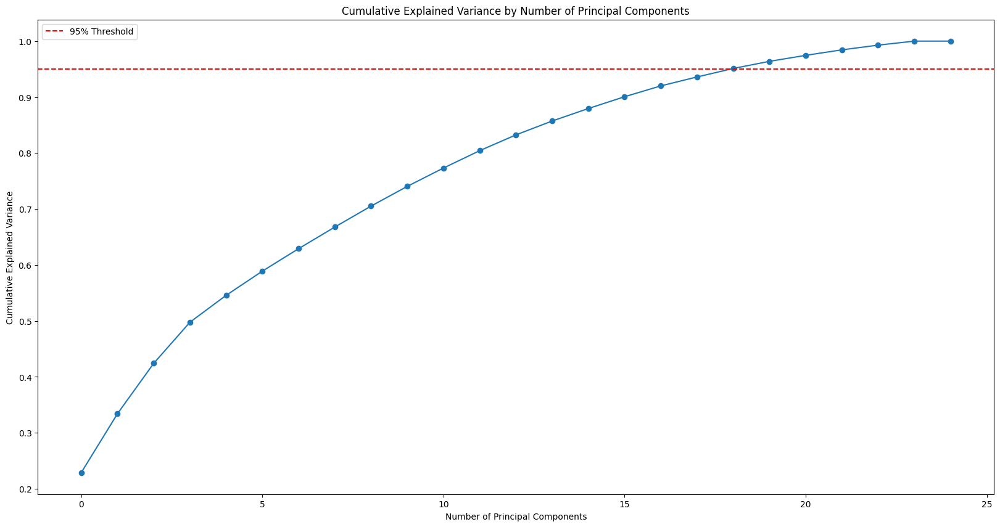

19
[0.2290147  0.33427838 0.42421285 0.49767194 0.54577952 0.58896752
 0.62912303 0.6677374  0.70519328 0.74041531 0.7732182  0.8042623
 0.83242405 0.85723789 0.87955851 0.90064033 0.91998453 0.93597384
 0.95110577 0.96387797 0.97458315 0.98439461 0.99282389 0.9999999
 1.        ]


In [11]:
# Figure 1: Cumulative Explained Variance by Number of Principal Components

# Dropping any non-numeric columns + asthma_prevalence (since that's what we're trying to predict)
unsupervised_df = final_combined_df.drop(columns=['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'asthma_prevalence'])

#Using Standard Scaler to standardize the dataset
scaler = StandardScaler()
scaled = scaler.fit_transform(unsupervised_df)

# Running PCA
pca = PCA()
x_pca = pca.fit_transform(scaled)

# Explained variance ratio
# Plotting the cumulative explained variance by number of principal components
plt.figure(figsize=(20,10))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.axhline(y=0.95, label='95% Threshold', color='red', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Principal Components')
plt.legend(loc='upper left')
plt.show()

# Keeping only the first n principal components that represent 95% of the variance
threshold = 0.95
cumulative = np.cumsum(pca.explained_variance_ratio_)
n = np.where(cumulative >= threshold)[0][0] + 1
print(n)
x_pca_n = x_pca[:,:n]

# Print the cumulative explained variance for paper
print(np.cumsum(pca.explained_variance_ratio_))

We first used standard scaler to normalize all features and set up our data for PCA. Then, we ran PCA to reduce dimensionality, and we've kept the top 19 components that represent 95% of the variance. 

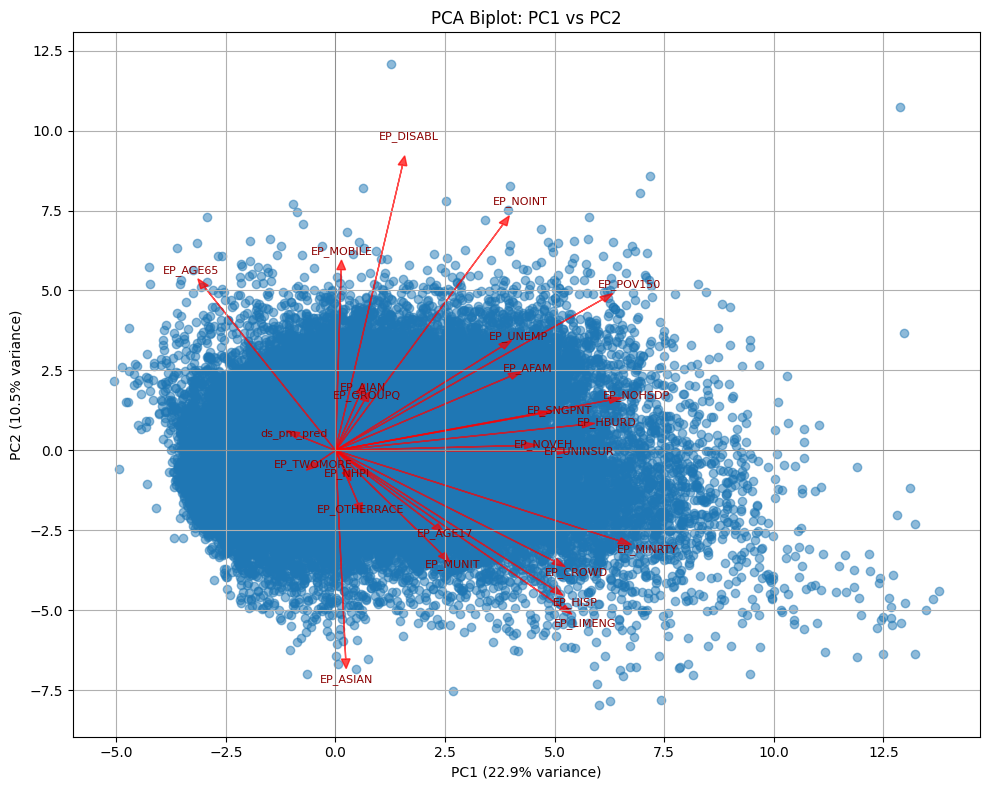

In [12]:
# Figure 2: PCA Biplot

# Create a DataFrame of the PCA results
pc_columns = [f'PC{i+1}' for i in range(x_pca.shape[1])]
pca_df = pd.DataFrame(x_pca, columns=pc_columns)

# Create a DataFrame for loadings (feature contributions)
loadings = pd.DataFrame(
    pca.components_.T,  # Shape = [n_features, n_components]
    columns=pc_columns,
    index=unsupervised_df.columns
)

# Plot: biplot
plt.figure(figsize=(10, 8))

# Plot scores
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5, label='Data Points')

# Plot loadings as arrows
arrow_size = 19  # Adjust this value as needed for clarity

for feature in loadings.index:
    x = loadings.loc[feature, 'PC1'] * arrow_size
    y = loadings.loc[feature, 'PC2'] * arrow_size
    plt.arrow(0, 0, x, y, color='red', alpha=0.7, head_width=0.2)
    plt.text(x * 1.1, y * 1.1, feature, color='darkred', ha='center', va='center', fontsize=8)

# Labels and grid
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}% variance)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}% variance)')
plt.title('PCA Biplot: PC1 vs PC2')
plt.grid(True)
plt.axhline(0, color='grey', lw=0.5)
plt.axvline(0, color='grey', lw=0.5)
plt.tight_layout()
plt.show()

We created a biplot, which can be interpreted as follows: PC1 accounts for 22.9% of the variance, driven by high loadings from EP_POV150, EP_NOHSD, EP_HBURD, EP_LIMENG, EP_MINRTY, EP_HISP, EP_CROWD. PC2 accounts for 10.5% of the variance, driven by high loadings from EP_DISABL, EP_NOINT, EP_MOBILE, EP_AGE65. 

### K-Means Clustering

In [13]:
# Running K-Means Clustering with different values of K and using Silhouette Score to find the optimal number of clusters
# This may take a few minutes to run
k = range(2,10)
scores = []
for i in k:
    # using random_state=42 for consistency
    kmeans = KMeans(n_clusters=i,random_state=42)
    res = kmeans.fit_predict(x_pca_n)
    score = silhouette_score(x_pca_n,res)
    scores.append(score)
    print(i,score)
best_silhouette = max(scores)

2 0.2836522684247985
3 0.2657158772597962
4 0.11970057183924489
5 0.13376358564562732
6 0.12849211653769052
7 0.1259943973189945
8 0.130672973744701
9 0.08740792928912582


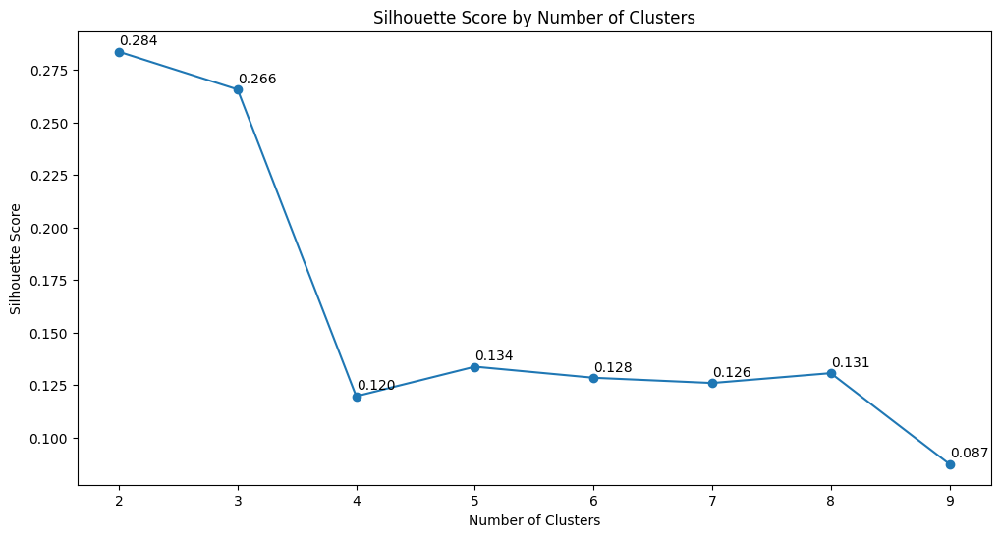

In [14]:
# Figure 3: Silhouette Score by Number of Clusters

# Visualizing the Silhouette Scores
plt.figure(figsize=(12,6))
plt.plot(k,scores, 'o-')
plt.title('Silhouette Score by Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
# Labeling the points
k = range(2,10)
for i,score in zip(k,scores):
    plt.text(i+0.001,score+0.0032, f"{score:.3f}")
plt.show()

Based off of silhouette scores, the ideal number of clusters is either 2 with a score of 0.284 or 3 with a score of 0.266.

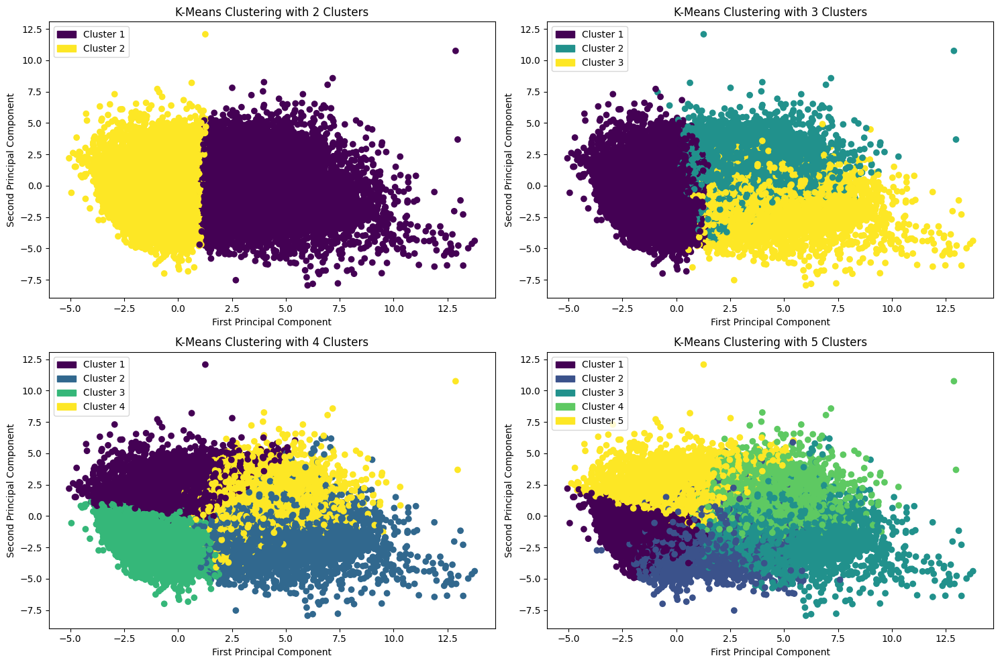

In [15]:
# Figure 4: Plotting Clusters on 2D Space

# Plotting the clusters in a 2D space (based on the first two PCA components)
plt.figure(figsize=(15,10))
for i,j in enumerate(range(2,6)):
    kmeans = KMeans(n_clusters=j, random_state=42)
    res = kmeans.fit_predict(x_pca_n)
    plt.subplot(2,2,i+1)
    plt.scatter(x_pca_n[:,0],x_pca_n[:,1], c=res)
    plt.title(f'K-Means Clustering with {j} Clusters')
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    # Adding a legend for each cluster (i+1 to account for zero indexing)
    labels = [f'Cluster {i+1}' for i in range(j)]
    colors = plt.cm.get_cmap('viridis', j)
    color_labels =[matplotlib.patches.Patch(color=colors(i),label=labels[i]) for i in range(j)]
    plt.legend(handles=color_labels, loc='upper left')
plt.tight_layout()
plt.show()

Looking at these visuals, we can see that choosing 3 clusters provides the best balance between capturing complexity and having adequate separation between the clusters. Despite the silhouette score being a bit lower, the 3-cluster solution will allow us to discover deeper patterns that would be missed with a 2 way split. 

,count,mean,std,min,25%,50%,75%,max
Cluster,,,,,,,,
0,47404.0,0.103324,0.011741,0.050,0.095,0.103,0.111,0.156
1,12643.0,0.121743,0.015067,0.076,0.111,0.121,0.131,0.207
2,7321.0,0.103479,0.014190,0.061,0.094,0.102,0.112,0.169


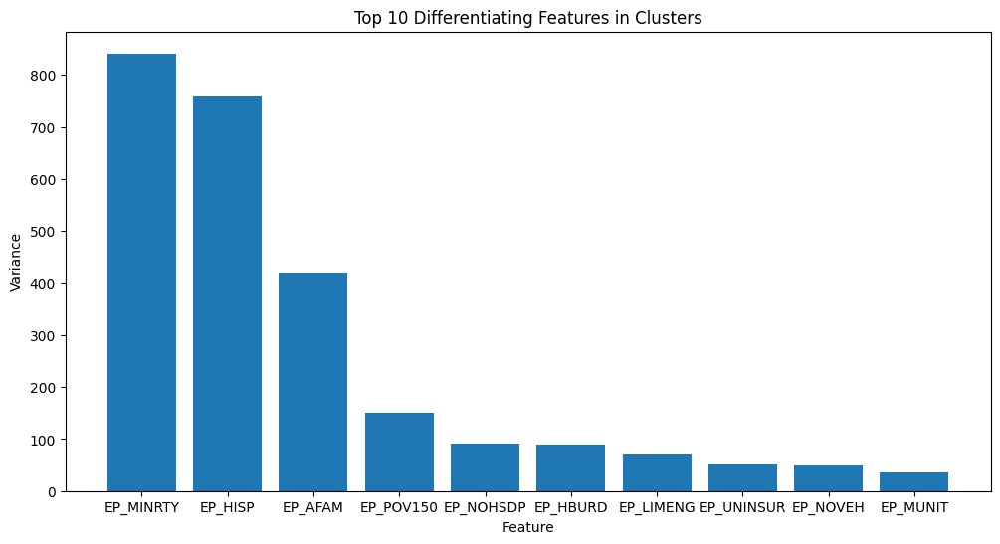

EP_MINRTY     841.359564
EP_HISP       757.762753
EP_AFAM       418.433038
EP_POV150     151.177260
EP_NOHSDP      90.540956
EP_HBURD       89.032296
EP_LIMENG      69.513751
EP_UNINSUR     50.631151
EP_NOVEH       49.056687
EP_MUNIT       36.599717
dtype: float64

In [16]:
# Figure 5: Top 10 Differentiating Features in Clusters

# Running the final k-means clustering with 3 clusters + adding the cluster labels to the original dataframe
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_result = kmeans.fit_predict(x_pca_n)
final_combined_df['Cluster'] = kmeans_result

# Getting the summary statistics of the clusters for asthma prevalence
clustering_asthma =final_combined_df.groupby('Cluster')['asthma_prevalence'].describe()
display(clustering_asthma)

# Looking at the top 10 most differing features for each cluster
# getting the means, then finding the ones with most variance between the 3 clusters
most_var = final_combined_df.groupby('Cluster').mean(numeric_only=True).var()
top10 = most_var.sort_values(ascending=False).head(10)
# Plotting the top 10 most differing features
plt.figure(figsize=(12,6))
plt.bar(top10.index, top10.values)
plt.xlabel('Feature')
plt.ylabel('Variance')
plt.title('Top 10 Differentiating Features in Clusters')
plt.show()

# Table of top 10 most differing features
display(top10)

From the table, we can see that the highest average asthma prevalence is in cluster 1 (12.17%), and the lowest prevalence is in cluster 0 (10.33%). To better understand how the 3 clusters differ, we visualized which features had the highest variance between clusters. The top two were EP_MINRTY: Estimated Percentage Minority Population and EP_HISP: Estimated Percentage of Hispanic Population. This suggests the demographic and socioeconomic composition are the key factors that separate the clusters.

### Community Detection

In [17]:
# Using Louvain Community Detection
# First finding the ideal parameters that give us the best modularity score (may take a bit to run)
num_neighbors = [10,11,12,15,20]
resolutions = [0.8,0.9,1]
results = []
for i in num_neighbors:
    # Making a graph using our PCA results
    matrix = kneighbors_graph(x_pca_n, i,include_self=False)
    graph = nx.from_scipy_sparse_array(matrix)
    for j in resolutions:
        #Running Louvain community detection (using seed to control randomness)
        comm = nx.community.louvain_communities(graph,seed=42, resolution=j)
        mod = modularity(graph,comm)
        results.append({'n': i, 'res':j,'mod':mod})
# Displaying the table to see the ideal parameters
best_comm_params = pd.DataFrame(results)
best_comm_params = best_comm_params.pivot(index='n',columns='res', values='mod')
display(best_comm_params)

res,0.8,0.9,1.0
n,,,
10,0.711602,0.720069,0.713407
11,0.707820,0.715582,0.712437
12,0.714988,0.717492,0.718419
15,0.694793,0.697053,0.706100
20,0.703471,0.703409,0.704916


We can see that the optimal parameters are to use 10 numbers of neighbors when creating the graph, and a resolution of 0.9 when running the Louvain communities algorithm.

In [18]:
# Running Louvain community detection with the best parameters we found (n=10, resolution=0.9)
matrix = kneighbors_graph(x_pca_n, 10,include_self=False)
graph = nx.from_scipy_sparse_array(matrix)
comm = nx.community.louvain_communities(graph, seed=42, resolution=0.9)
mod_score = modularity(graph,comm)
print(mod_score)

# Adding the community labels to the original dataframe
for i,j in enumerate(comm):
    for k in j:
        final_combined_df.loc[k,'Community'] = i

0.720069456716575


The modularity score is 0.720. Let's visualize the communities in 2D using our PCA results. 

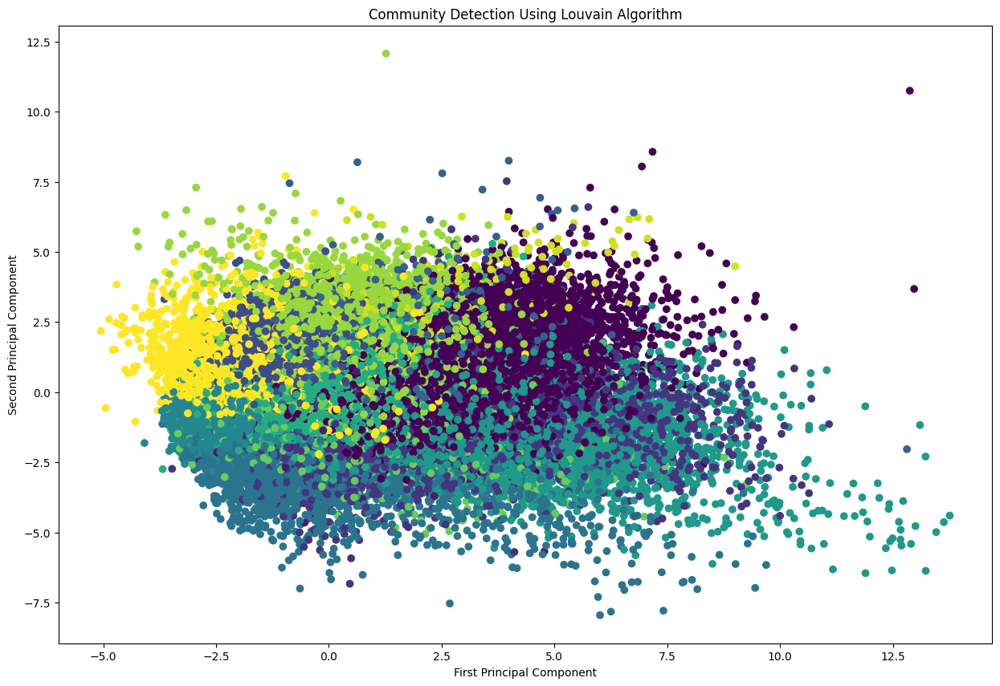

In [19]:
# Figure 6: Community Detection using Louvain Algorithm on 2D Space

# Generating a plot using our PCA results for the communities
plt.figure(figsize=(15,10))
plt.scatter(x_pca_n[:,0],x_pca_n[:,1], c=final_combined_df['Community'])
plt.title('Community Detection Using Louvain Algorithm')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()

This visual shows the communities within a 2D space using results from PCA. Unlike K-Means Clustering which relies on spacial distance, community detection algorithms (we used Louvain) creates communities based on graph connectivity. This is why some communities seem to be so intermixed when graphed on a 2D space, despite there being substantial differences between them. Let's look at a asthma prevalence between the different communities and again graph the top 10 most differing features.

,count,mean,std,min,25%,50%,75%,max
Community,,,,,,,,
0.0,8752.0,0.120407,0.015951,0.077,0.109,0.119,0.1310,0.207
1.0,1132.0,0.110575,0.011843,0.070,0.103,0.110,0.1180,0.150
2.0,2312.0,0.100660,0.016799,0.061,0.088,0.096,0.1110,0.159
3.0,9287.0,0.109944,0.009127,0.081,0.104,0.110,0.1160,0.150
4.0,2015.0,0.111907,0.016021,0.067,0.101,0.110,0.1210,0.171
5.0,4549.0,0.090202,0.010869,0.050,0.083,0.090,0.0970,0.134
6.0,11538.0,0.100663,0.008982,0.073,0.094,0.101,0.1070,0.132
7.0,4989.0,0.101159,0.012506,0.072,0.093,0.099,0.1080,0.153
8.0,9749.0,0.110229,0.012391,0.073,0.101,0.110,0.1190,0.163


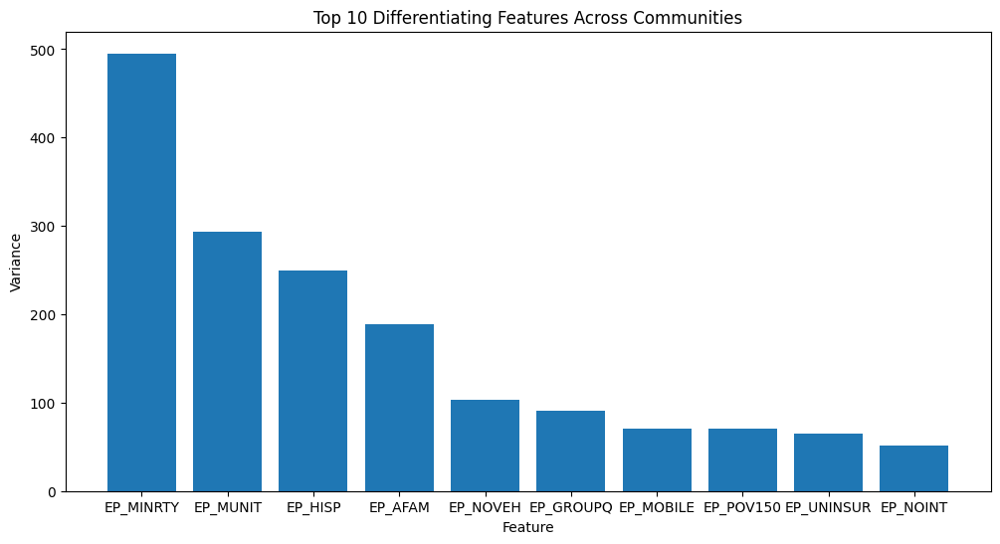

EP_MINRTY     495.204183
EP_MUNIT      292.997235
EP_HISP       250.032258
EP_AFAM       189.190862
EP_NOVEH      103.507646
EP_GROUPQ      90.966824
EP_MOBILE      70.613462
EP_POV150      70.311698
EP_UNINSUR     65.245488
EP_NOINT       52.017614
dtype: float64

In [20]:
# Figure 7: Top 10 Differing Features Across Communities

# Getting the summary statistics of the communities for asthma prevalence
comm_asthma =final_combined_df.groupby('Community')['asthma_prevalence'].describe()
display(comm_asthma)

# Looking at the top 10 most differing features for each communitity
# getting the means, then finding the ones with most variance
most_var_community = final_combined_df.groupby('Community').mean(numeric_only=True).var()
top10_comm = most_var_community.sort_values(ascending=False).head(10)
# Plotting the top 10 most differing features
plt.figure(figsize=(12,6))
plt.bar(top10_comm.index, top10_comm.values)
plt.xlabel('Feature')
plt.ylabel('Variance')
plt.title('Top 10 Differentiating Features Across Communities')
plt.show()

# Top 10 most differing features
display(top10_comm)

Community detection using the Louvain algorithm formed 14 communities. Community 12 had the highest average asthma prevalence (12.68%), while community 5 had the lowest asthma prevalence (9.02%). The top two differentiating features across the communities were EP_MINRTY: Estimated Percentage of Minority Population and E_MUNIT: Estimated Percentage of Multi-Units. This suggests the demographic composition and community density are the key factors that separate the clusters.

### Multicollinearity

Before we move forward to the supervised learning section, we need to check for multi-collinearity, especially between the clusters and communities. 

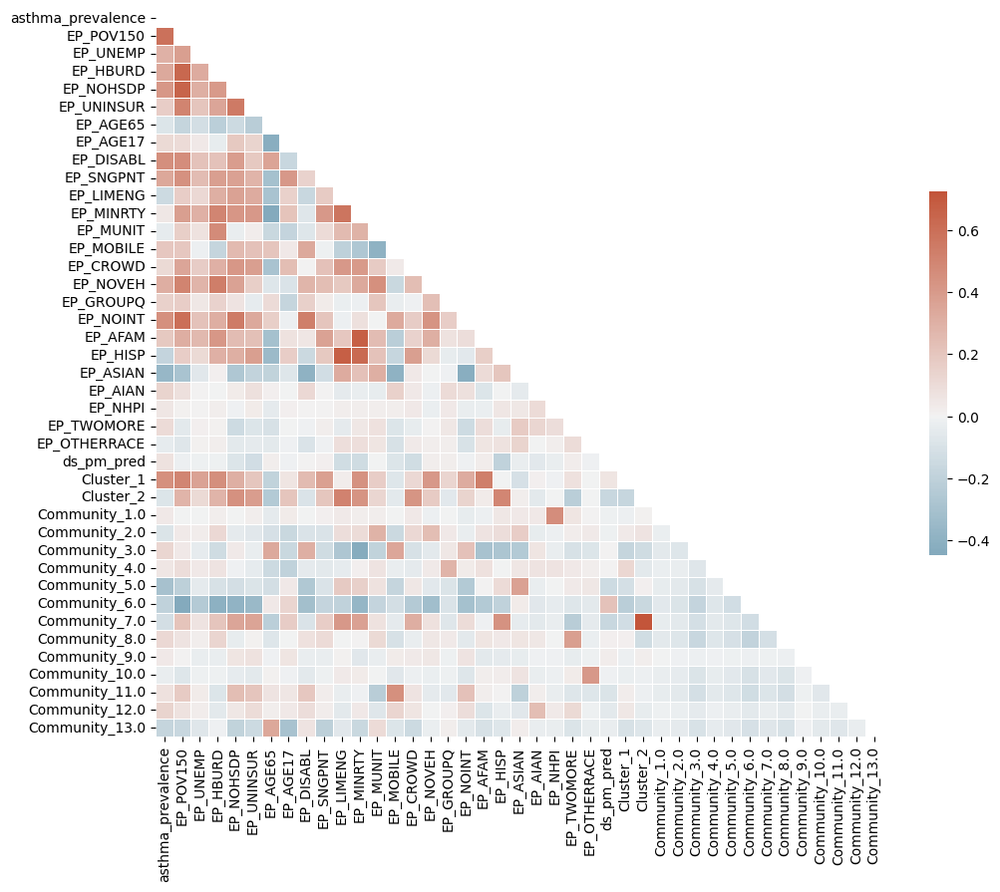

In [21]:
# Figure 8: Pairwise Correlation Heatmap

# Correlation DF
corr_df = final_combined_df.drop(columns=['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS'])

# One-hot encode the 'Cluster' and 'Community' features
corr_df = pd.get_dummies(corr_df, columns=['Cluster', 'Community'], drop_first=True)
corr_df = corr_df.astype({col: 'float64' for col in corr_df.select_dtypes(include='bool').columns})

# Compute the correlation matrix
corr = corr_df.corr(method="spearman") # Spearman picked because it shows non-parametric correlations and handles ties well.

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.tight_layout()

From a quick glance, most correlations between the communities and clusters are weak with the exception of community 7 and the second cluster. This heatmap is good for looking at non-parametric correlations between pairs of variables, but we will check the Variance Inflation Factor analysis to evaluate multivariate correlations.

In [22]:
# Using the original features
X = final_combined_df.drop(columns=['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS'])

# One-hot encode the 'Cluster' and 'Community' features
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
X = X.astype({col: 'float64' for col in X.select_dtypes(include='bool').columns})

# Add a constant column (intercept) — required for VIF calc
X_const = add_constant(X)

# Calculate the VIF for each feature
vif = pd.DataFrame()
vif['Feature'] = X_const.columns
vif['VIF'] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]

print(vif)

              Feature            VIF
0               const     254.176879
1   asthma_prevalence       3.213648
2           EP_POV150       4.423896
3            EP_UNEMP       1.423941
4            EP_HBURD       2.819696
5           EP_NOHSDP       3.792924
6          EP_UNINSUR       2.344734
7            EP_AGE65       2.446178
8            EP_AGE17       2.272970
9           EP_DISABL       2.125742
10          EP_SNGPNT       1.976796
11          EP_LIMENG       3.742713
12          EP_MINRTY  188274.905052
13           EP_MUNIT       2.376728
14          EP_MOBILE       2.431804
15           EP_CROWD       1.951962
16           EP_NOVEH       2.511790
17          EP_GROUPQ       2.559752
18           EP_NOINT       2.107654
19            EP_AFAM  104495.332859
20            EP_HISP   87798.735770
21           EP_ASIAN   12990.679398
22            EP_AIAN    3602.174741
23            EP_NHPI      78.259672
24         EP_TWOMORE    2027.519984
25       EP_OTHERRACE     317.398746
2

There are mutually exclusive race/ethnicity indicators that are likely components of a composite variable like EP_MINRTY. It makes sense to drop EP_MINRTY and retain the individual minority indicators. Evaluating the VIF without EP_MINRTY yields: 

In [23]:
# Using the original features
X = final_combined_df.drop(columns=['Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'EP_MINRTY'])

# One-hot encode the 'Cluster' and 'Community' features
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
X = X.astype({col: 'float64' for col in X.select_dtypes(include='bool').columns})

# Add a constant column (intercept) — required for VIF calc
X_const = add_constant(X)

# Calculate the VIF for each feature
vif = pd.DataFrame()
vif['Feature'] = X_const.columns
vif['VIF'] = [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]

print(vif)

              Feature         VIF
0               const  254.173669
1   asthma_prevalence    3.213549
2           EP_POV150    4.423514
3            EP_UNEMP    1.423913
4            EP_HBURD    2.819531
5           EP_NOHSDP    3.792924
6          EP_UNINSUR    2.344732
7            EP_AGE65    2.446132
8            EP_AGE17    2.272937
9           EP_DISABL    2.125742
10          EP_SNGPNT    1.976788
11          EP_LIMENG    3.742713
12           EP_MUNIT    2.376728
13          EP_MOBILE    2.431575
14           EP_CROWD    1.951925
15           EP_NOVEH    2.511790
16          EP_GROUPQ    2.559731
17           EP_NOINT    2.107654
18            EP_AFAM    3.618374
19            EP_HISP    4.595009
20           EP_ASIAN    2.391736
21            EP_AIAN    2.017174
22            EP_NHPI    2.096479
23         EP_TWOMORE    1.416582
24       EP_OTHERRACE    1.892395
25         ds_pm_pred    1.134344
26          Cluster_1    3.020432
27          Cluster_2    4.094111
28      Commun

Removing EP_MINRTY yields cleaner features. Most features are under 5.00. We will monitor community 6, but retain it for now. 

## Supervised Learning Algorithms

### Baseline Models Comparison

Unsupervised learning algorithms above helped us for dimensionality reduction and to generate additional features. However, depending on the structure of the original data, techniques like PCA can also lead to information loss, which may negatively impact model performance.

To evaluate the most effective feature sets, we established baseline supervised models using the following three approaches:

        1. Raw features only
        2. PCA transformed features
        3. Raw features combined with outputs from K-Means clustering and community detection

For each approach, we trained two baseline models:
        - a baseline linear regression model 
        - a baseline random forest regressor
        
From there,we compare their performance using Mean Absolute Error (MAE) and R² score.


First, we start with the raw features only.
For the Linear Regression model, no regularization was applied, as we observed no significant improvement in performance when using L1, L2, or Elastic Net regularization during our exploration.

In [24]:
# === Data Prep ===
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 
    'countyname', 'FIPS', 'Cluster', 'Community', 'EP_MINRTY'
])
y = final_combined_df['asthma_prevalence']

# === CV Strategy ===
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# === LINEAR REGRESSION ===
lr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

lr_mae_scores = -cross_val_score(lr_pipeline, X, y, scoring='neg_mean_absolute_error', cv=cv)
lr_r2_scores = cross_val_score(lr_pipeline, X, y, scoring='r2', cv=cv)

print("Linear Regression with Original Features:")
print(f"CV MAE: {lr_mae_scores.mean():.5f} ± {lr_mae_scores.std():.5f}")
print(f"CV R²: {lr_r2_scores.mean():.5f} ± {lr_r2_scores.std():.5f}")

# === RANDOM FOREST ===
rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Optional for RF but kept for parity
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

rf_mae_scores = -cross_val_score(rf_pipeline, X, y, scoring='neg_mean_absolute_error', cv=cv)
rf_r2_scores = cross_val_score(rf_pipeline, X, y, scoring='r2', cv=cv)

print("\nRandom Forest with Original Features:")
print(f"CV MAE: {rf_mae_scores.mean():.5f} ± {rf_mae_scores.std():.5f}")
print(f"CV R²: {rf_r2_scores.mean():.5f} ± {rf_r2_scores.std():.5f}")

Linear Regression with Original Features:
CV MAE: 0.00650 ± 0.00002
CV R²: 0.68076 ± 0.00525

Random Forest with Original Features:
CV MAE: 0.00563 ± 0.00003
CV R²: 0.75335 ± 0.00271


The baseline models with raw features performed decently with a R² score of 0.68 for the linear regression model, and a R² score of 0.75 for the random forest model. The random forest had better predictive performance. 

Next, we will build the baseline models with the PCA transformed features only.

In [25]:
# === Data Prep ===
X = x_pca_n  # PCA-transformed features that explain 95% variance
y = final_combined_df['asthma_prevalence']

# === CV Strategy ===
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# === LINEAR REGRESSION ===
lr_model = LinearRegression()

lr_mae_scores = -cross_val_score(lr_model, X, y, scoring='neg_mean_absolute_error', cv=cv)
lr_r2_scores = cross_val_score(lr_model, X, y, scoring='r2', cv=cv)

print("Linear Regression with PCA Components:")
print(f"CV MAE: {lr_mae_scores.mean():.5f} ± {lr_mae_scores.std():.5f}")
print(f"CV R²: {lr_r2_scores.mean():.5f} ± {lr_r2_scores.std():.5f}")

# === RANDOM FOREST ===
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

rf_mae_scores = -cross_val_score(rf_model, X, y, scoring='neg_mean_absolute_error', cv=cv)
rf_r2_scores = cross_val_score(rf_model, X, y, scoring='r2', cv=cv)

print("\nRandom Forest with PCA Components:")
print(f"CV MAE: {rf_mae_scores.mean():.5f} ± {rf_mae_scores.std():.5f}")
print(f"CV R²: {rf_r2_scores.mean():.5f} ± {rf_r2_scores.std():.5f}")


Linear Regression with PCA Components:
CV MAE: 0.00698 ± 0.00003
CV R²: 0.63319 ± 0.00642

Random Forest with PCA Components:
CV MAE: 0.00634 ± 0.00003
CV R²: 0.69080 ± 0.00229


While PCA did help with the dimensionality reduction, it did not improve the model performance.
Instead, we are observing a significant drop in the performance of both the linear regression and random forest models when using the PCA transformed features.

Next, we will explore the option of combining the original features with the clustering results.

In [26]:
# Training Models with Original Features +  the 'Cluster' and 'Community' features generated by unsupervised learning

# Using the original features
X = final_combined_df.drop(columns=['asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 'countyname', 'FIPS', 'EP_MINRTY'])

# One-hot encode the 'Cluster' and 'Community' features
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
X = X.astype({col: 'float64' for col in X.select_dtypes(include='bool').columns})

# Target variable
y = final_combined_df['asthma_prevalence']

# Define 5-Fold CV strategy
cv = KFold(n_splits=5, shuffle=True, random_state=42)

### LINEAR REGRESSION WITH 5-FOLD CV ###
lr_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

lr_mae_scores = -cross_val_score(lr_pipeline, X, y, scoring='neg_mean_absolute_error', cv=cv)
lr_r2_scores = cross_val_score(lr_pipeline, X, y, scoring='r2', cv=cv)

print("Linear Regression with Original + Cluster/Community (5-Fold CV):")
print(f"Mean MAE: {lr_mae_scores.mean():.5f} ± {lr_mae_scores.std():.5f}")
print(f"Mean R²: {lr_r2_scores.mean():.5f} ± {lr_r2_scores.std():.5f}")

### RANDOM FOREST WITH 5-FOLD CV ###
rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # RF doesn't need scaling, but included for parity
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

rf_mae_scores = -cross_val_score(rf_pipeline, X, y, scoring='neg_mean_absolute_error', cv=cv)
rf_r2_scores = cross_val_score(rf_pipeline, X, y, scoring='r2', cv=cv)

print("\nRandom Forest with Original + Cluster/Community (5-Fold CV):")
print(f"Mean MAE: {rf_mae_scores.mean():.5f} ± {rf_mae_scores.std():.5f}")
print(f"Mean R²: {rf_r2_scores.mean():.5f} ± {rf_r2_scores.std():.5f}")

Linear Regression with Original + Cluster/Community (5-Fold CV):
Mean MAE: 0.00641 ± 0.00003
Mean R²: 0.68811 ± 0.00522

Random Forest with Original + Cluster/Community (5-Fold CV):
Mean MAE: 0.00563 ± 0.00003
Mean R²: 0.75255 ± 0.00244


Adding the clustering and community outcomes to the raw features slightly improved the linear regression model performance, but had a slightly unfavorable impact on the random forest model performance. 

### Gradient Boosting Regression Model

Another key finding from reviewing the baseline models is that the random forest models generally performed much better than the linear regression models, regardless of the input features used. This suggests that the original dataset might contain complex nonlinear relationships, making nonlinear models a better choice in this case.

For this reason, Gradient Boosting Regression will be used to help improve model performance. Alongside this, we will perform feature selection and cross-validation to further enhance performance and increase robustness.

Cross-Validation Results (Gradient Boosting):
CV MAE: 0.00616 ± 0.00009
CV R²: 0.70404 ± 0.00746

Top Features:
['EP_POV150', 'EP_NOHSDP', 'EP_DISABL', 'EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'ds_pm_pred', 'Cluster_1']


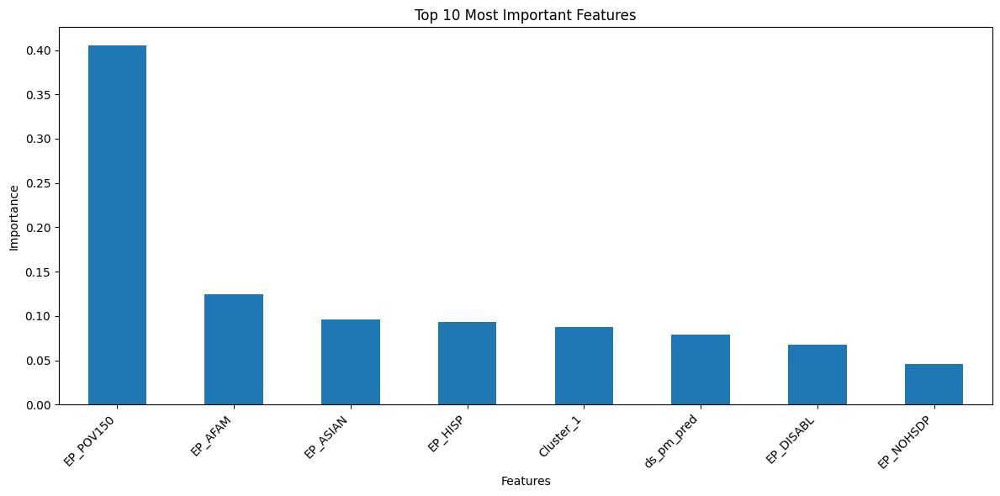

In [27]:
# === Data Prep ===
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 
    'countyname', 'FIPS', 'EP_MINRTY'
])
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
y = final_combined_df['asthma_prevalence']

# === Column Transformer ===
original_features = [col for col in X.columns if not col.startswith(('Cluster_', 'Community_'))]
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), original_features)
    ],
    remainder='passthrough'
)

# === Gradient Boosting Pipeline ===
gb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectFromModel(GradientBoostingRegressor(random_state=42))),
    ('regressor', GradientBoostingRegressor(
        n_estimators=200,
        max_depth=5,
        random_state=42,
        max_features=0.5
    ))
])

# === Cross-Validation ===
cv = KFold(n_splits=5, shuffle=True, random_state=42)
mae_scorer = make_scorer(mean_absolute_error)

cv_mae_scores = -cross_val_score(gb_pipeline, X, y, cv=cv, scoring='neg_mean_absolute_error')
cv_r2_scores = cross_val_score(gb_pipeline, X, y, cv=cv, scoring='r2')

print("Cross-Validation Results (Gradient Boosting):")
print(f"CV MAE: {cv_mae_scores.mean():.5f} ± {cv_mae_scores.std():.5f}")
print(f"CV R²: {cv_r2_scores.mean():.5f} ± {cv_r2_scores.std():.5f}")

# === Final Fit (for feature importance only, not evaluation) ===
gb_pipeline.fit(X, y)

# === Feature Importance ===
# Get transformed feature names after preprocessing
all_feature_names = X.columns
selected_mask = gb_pipeline.named_steps['feature_selection'].get_support()
selected_features = np.array(all_feature_names)[selected_mask]

importances = gb_pipeline.named_steps['regressor'].feature_importances_
feature_imp = pd.Series(importances, index=selected_features).sort_values(ascending=False)

print("\nTop Features:")
print(selected_features.tolist())

# === Plot Top 10 Important Features ===
plt.figure(figsize=(12, 6))
feature_imp[:10].plot(kind='bar')
plt.title('Top 10 Most Important Features')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

We can see the Gradient Boosting Regression model above was able to make a better prediction than the linear regression model, but not was good as the random forest. 

From the feature importances selection, we notice that the EP_POV150: percentage of persons below 150% poverty estimate and EP_AFAM: percentage of Black/African American, not Hispanic or Latino are the two factors that correlate with the 'Prevalence of Asthma' the most. 

### XGBoost Regression Model

We will now use the XGBoost Regression model to performan regularization on the features to lower the model complexity. 



But first, we need to find the optimal learning rate and number of estimators for the XGBoost model. This will help achieve the best performance while avoiding overfitting. To do so, we will examine the learning curves to see how these parameters affect the MAE error, and select the optimal values where the MAE stabilizes and stops decreasing.

In [28]:
# === Data Preparation ===
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 
    'countyname', 'FIPS', 'EP_MINRTY'
])
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
X = X.astype({col: 'float64' for col in X.select_dtypes(include='bool').columns})
y = final_combined_df['asthma_prevalence']

# === Parameter Grid ===
param_dist = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7, 9],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.5, 0.8, 1.0],
    'gamma': [0, 0.1, 0.5],
    'reg_lambda': [0, 0.1, 0.5, 1, 5],
    'reg_alpha': [0, 0.1, 0.5, 1]
}

# === Model and CV Setup ===
xgb_base = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    verbosity=0
)

cv = KFold(n_splits=5, shuffle=True, random_state=42)

# === Randomized Search Using MAE ===
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_dist,
    n_iter=50,
    scoring='neg_mean_absolute_error',
    cv=cv,
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# === Run Search ===
random_search.fit(X, y)

# === Output Best Results ===
print("\nBest Cross-Validated MAE: {:.5f}".format(-random_search.best_score_))
print("Best Parameters Found:")
for param, value in random_search.best_params_.items():
    print(f"{param}: {value}")

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, subsample=0.6; total time=   2.0s
[CV] END colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, subsample=0.6; total time=   2.1s
[CV] END colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, subsample=0.6; total time=   2.1s
[CV] END colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, subsample=0.6; total time=   2.3s
[CV] END colsample_bytree=0.5, gamma=0.1, learning_rate=0.05, max_depth=5, min_child_weight=5, n_estimators=500, reg_alpha=0.1, reg_lambda=0, subsample=0.6; total time=   2.3s
[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1,

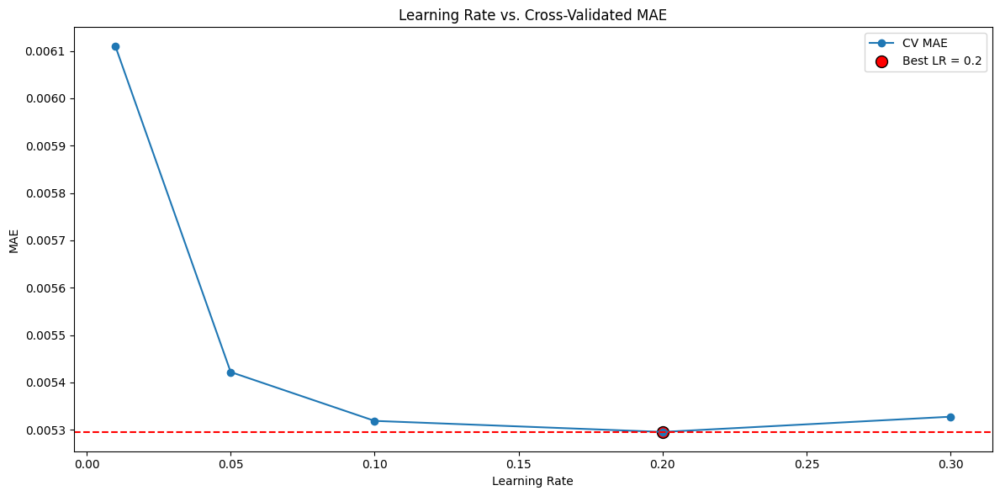

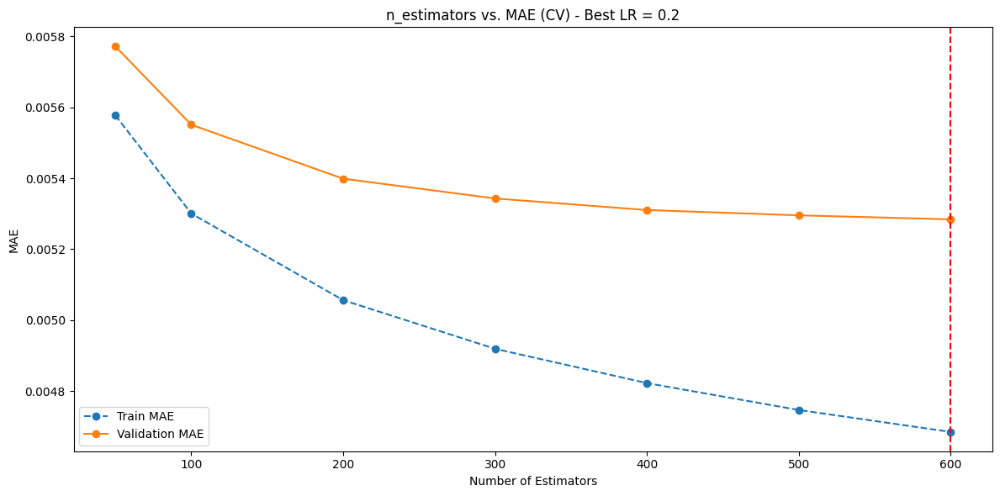


=== Final Cross-Validation Summary ===
Best Learning Rate: 0.2
Best n_estimators: 600
Final CV MAE: 0.00528


In [29]:
# === Data Prep ===
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc',
    'countyname', 'FIPS', 'EP_MINRTY'
])
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
X = X.astype({col: 'float64' for col in X.select_dtypes(include='bool').columns})
y = final_combined_df['asthma_prevalence']

# === CV Setup ===
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# === 1. Learning Rate Tuning ===
learning_rates = [0.01, 0.05, 0.1, 0.2, 0.3]
lr_mae_scores = []

for lr in learning_rates:
    model = XGBRegressor(
        learning_rate=lr,
        n_estimators=500,
        max_depth=5,
        min_child_weight=1,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=0,
        reg_alpha=0.5,
        gamma=0,
        objective='reg:squarederror',
        random_state=42
    )
    scores = -cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
    lr_mae_scores.append(np.mean(scores))

# Plot Learning Rate vs. MAE
best_lr_idx = np.argmin(lr_mae_scores)
best_lr = learning_rates[best_lr_idx]
best_lr_mae = lr_mae_scores[best_lr_idx]

plt.figure(figsize=(12, 6))
plt.plot(learning_rates, lr_mae_scores, 'o-', label='CV MAE')
plt.axhline(y=best_lr_mae, color='r', linestyle='--')
plt.scatter(best_lr, best_lr_mae, color='red', edgecolor='black', s=100, label=f'Best LR = {best_lr}')
plt.title('Learning Rate vs. Cross-Validated MAE')
plt.xlabel('Learning Rate')
plt.ylabel('MAE')
plt.legend()
plt.tight_layout()
plt.show()

# === 2. Estimator Tuning ===
estimator_range = [50, 100, 200, 300, 400, 500, 600]
train_mae_scores = []
val_mae_scores = []

for n in estimator_range:
    model = XGBRegressor(
        learning_rate=best_lr,
        n_estimators=n,
        max_depth=5,
        min_child_weight=1,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=0,
        reg_alpha=0.5,
        gamma=0,
        objective='reg:squarederror',
        random_state=42
    )
    scores = cross_validate(
        model, X, y,
        scoring='neg_mean_absolute_error',
        cv=cv,
        return_train_score=True,
        n_jobs=-1
    )
    train_mae_scores.append(-np.mean(scores['train_score']))
    val_mae_scores.append(-np.mean(scores['test_score']))

# Plot Estimators vs. MAE
best_n_idx = np.argmin(val_mae_scores)
best_n = estimator_range[best_n_idx]
best_n_mae = val_mae_scores[best_n_idx]

plt.figure(figsize=(12, 6))
plt.plot(estimator_range, train_mae_scores, 'o--', label='Train MAE')
plt.plot(estimator_range, val_mae_scores, 'o-', label='Validation MAE')
plt.axvline(x=best_n, color='red', linestyle='--')
plt.title(f'n_estimators vs. MAE (CV) - Best LR = {best_lr}')
plt.xlabel('Number of Estimators')
plt.ylabel('MAE')
plt.legend()
plt.tight_layout()
plt.show()

# === Final Summary ===
print("\n=== Final Cross-Validation Summary ===")
print(f"Best Learning Rate: {best_lr}")
print(f"Best n_estimators: {best_n}")
print(f"Final CV MAE: {best_n_mae:.5f}")

Through the above learning curves, we can see that the optimal number of estimators is 500 and the optimal learning rate is 0.20. Therefore, we will use these parameters to train our final XGBoost model.

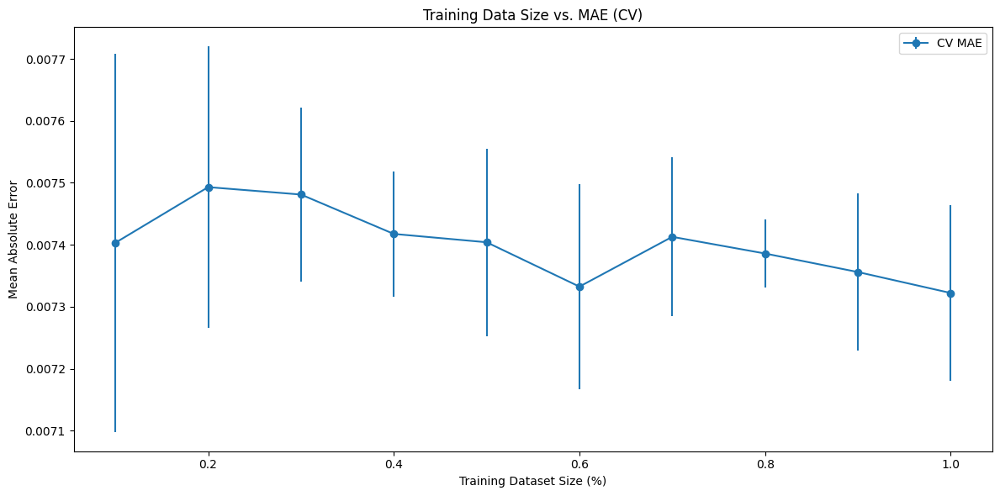

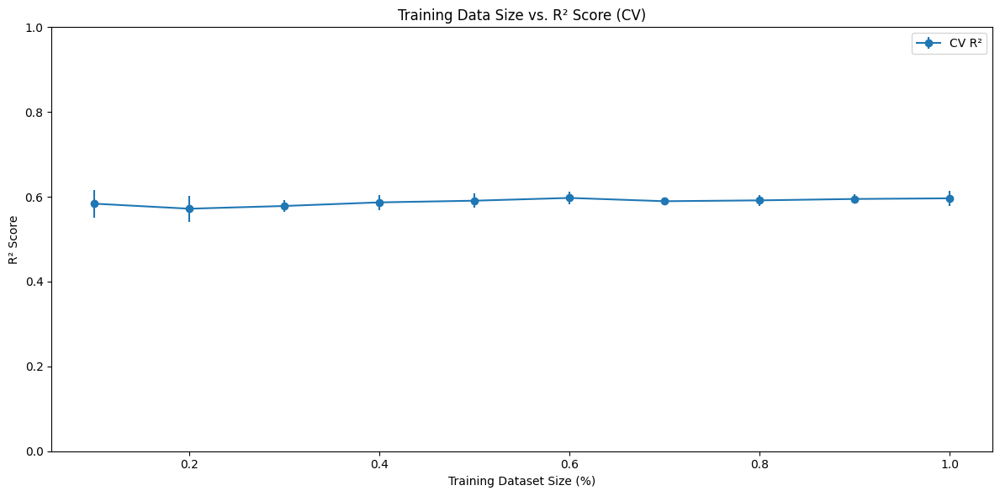


Final Model CV Summary (on training set):
MAE: 0.0073 ± 0.0001
R² : 0.5964 ± 0.0181


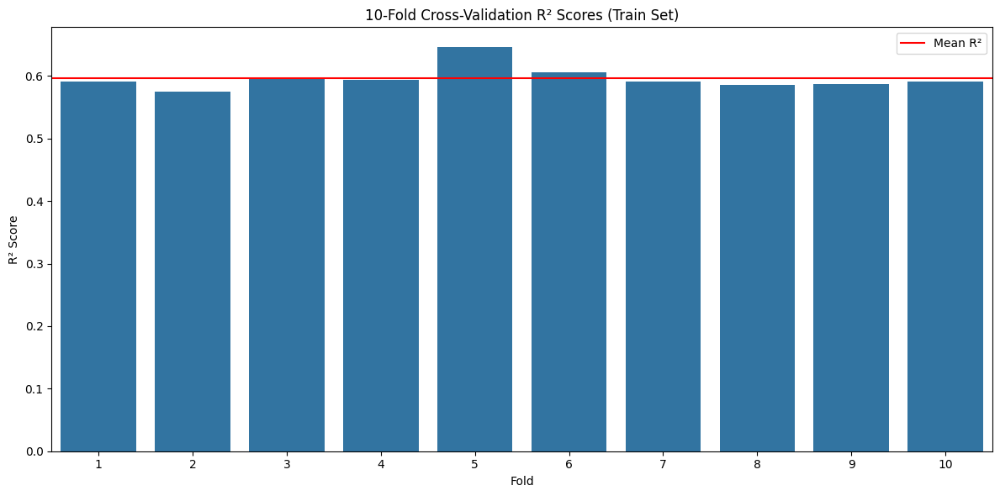

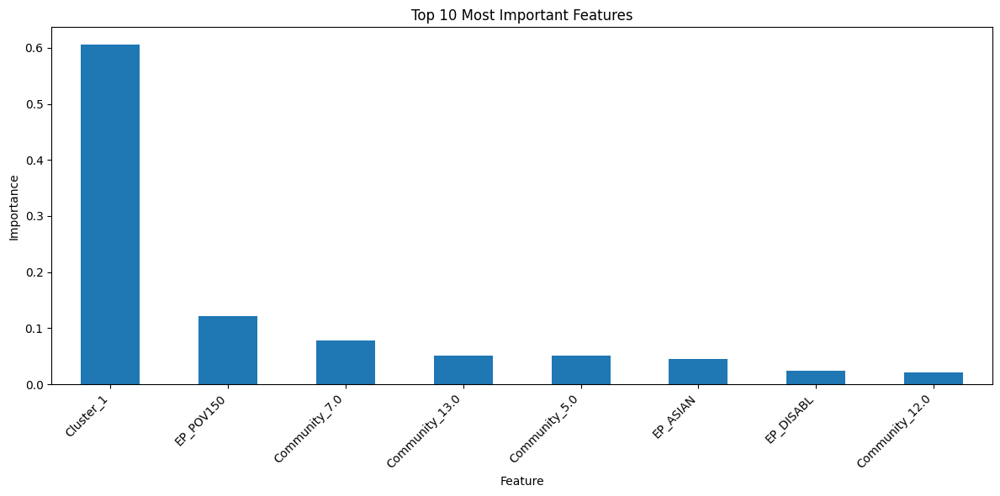

In [30]:
# === Define scorers ===
mae_scorer = make_scorer(mean_absolute_error)
r2_scorer = make_scorer(r2_score)

# === Data Prep ===
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc',
    'countyname', 'FIPS', 'EP_MINRTY'
])
X = pd.get_dummies(X, columns=['Cluster', 'Community'], drop_first=True)
X = X.astype({col: 'float64' for col in X.select_dtypes(include='bool').columns})
y = final_combined_df['asthma_prevalence']

# === Train/Test Split ===
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# === Preprocessor ===
numerical_features = X.columns.tolist()
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical_features)
])

# === Feature Selector ===
feature_selector = SelectFromModel(estimator=XGBRegressor(
    learning_rate=0.2,
    n_estimators=100,
    max_depth=3,
    random_state=42
))

# === Model Definition ===
xgb_model = XGBRegressor(
    learning_rate=0.2,
    n_estimators=500,
    max_depth=5,
    min_child_weight=1,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=0,
    reg_alpha=0.5,
    gamma=0,
    eval_metric='rmse',
    objective='reg:squarederror',
    random_state=42
)

# === Pipeline ===
xgb_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', feature_selector),
    ('regressor', xgb_model)
])

# === CV Setup ===
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# === Learning Curve Evaluation ===
train_sizes = np.linspace(0.1, 1.0, 10)
train_mae_means, train_mae_stds = [], []
train_r2_means, train_r2_stds = [], []

for size in train_sizes:
    n_train = int(len(X_train) * size)
    X_subset, y_subset = X_train[:n_train], y_train[:n_train]

    mae_scores = cross_val_score(xgb_pipeline, X_subset, y_subset, cv=cv, scoring=mae_scorer, n_jobs=-1)
    r2_scores = cross_val_score(xgb_pipeline, X_subset, y_subset, cv=cv, scoring=r2_scorer, n_jobs=-1)

    train_mae_means.append(np.mean(mae_scores))
    train_mae_stds.append(np.std(mae_scores))
    train_r2_means.append(np.mean(r2_scores))
    train_r2_stds.append(np.std(r2_scores))

# === Plot MAE Learning Curve ===
plt.figure(figsize=(12, 6))
plt.errorbar(train_sizes, train_mae_means, yerr=train_mae_stds, fmt='o-', label='CV MAE')
plt.title('Training Data Size vs. MAE (CV)')
plt.xlabel('Training Dataset Size (%)')
plt.ylabel('Mean Absolute Error')
plt.legend()
plt.tight_layout()
plt.show()

# === Plot R2 Learning Curve ===
plt.figure(figsize=(12, 6))
plt.errorbar(train_sizes, train_r2_means, yerr=train_r2_stds, fmt='o-', label='CV R²')
plt.title('Training Data Size vs. R² Score (CV)')
plt.xlabel('Training Dataset Size (%)')
plt.ylabel('R² Score')
plt.ylim(0, 1.0)
plt.legend()
plt.tight_layout()
plt.show()

# === Full CV Evaluation for Reporting (on training data only) ===
final_cv_scores = cross_validate(
    xgb_pipeline, X_train, y_train, cv=cv,
    scoring={'mae': mae_scorer, 'r2': r2_scorer},
    return_train_score=False
)

print(f"\nFinal Model CV Summary (on training set):")
print(f"MAE: {np.mean(final_cv_scores['test_mae']):.4f} ± {np.std(final_cv_scores['test_mae']):.4f}")
print(f"R² : {np.mean(final_cv_scores['test_r2']):.4f} ± {np.std(final_cv_scores['test_r2']):.4f}")

# === Cross-Validation R2 Scores Bar Plot ===
plt.figure(figsize=(12, 6))
sns.barplot(x=np.arange(1, 11), y=final_cv_scores['test_r2'])
plt.title('10-Fold Cross-Validation R² Scores (Train Set)')
plt.xlabel('Fold')
plt.ylabel('R² Score')
plt.axhline(y=np.mean(final_cv_scores['test_r2']), color='r', linestyle='-', label='Mean R²')
plt.legend()
plt.tight_layout()
plt.show()

# === Fit to Training Data and Predict on Test Set ===
xgb_pipeline.fit(X_train, y_train)
xgb_pred = xgb_pipeline.predict(X_test)


# === Feature Importances (from final model) ===
regressor = xgb_pipeline.named_steps['regressor']
selected_mask = xgb_pipeline.named_steps['feature_selection'].get_support()
selected_features = np.array(X.columns)[selected_mask]

importances = regressor.feature_importances_
feature_imp = pd.Series(importances, index=selected_features).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
feature_imp[:10].plot(kind='bar')
plt.title('Top 10 Most Important Features')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The top three most important features from the XGBoost regression model are 'Cluster_1', 'EP_POV150', and 'Cluster_2'.

Our final XGBoost regression model achieved a mediocre prediction performance (R2 score: 0.590) using the selected features and regularization techniques. The model also performed consistently across different training data sizes. 

Following graphs provide additional insights into the model's performance and predictions:

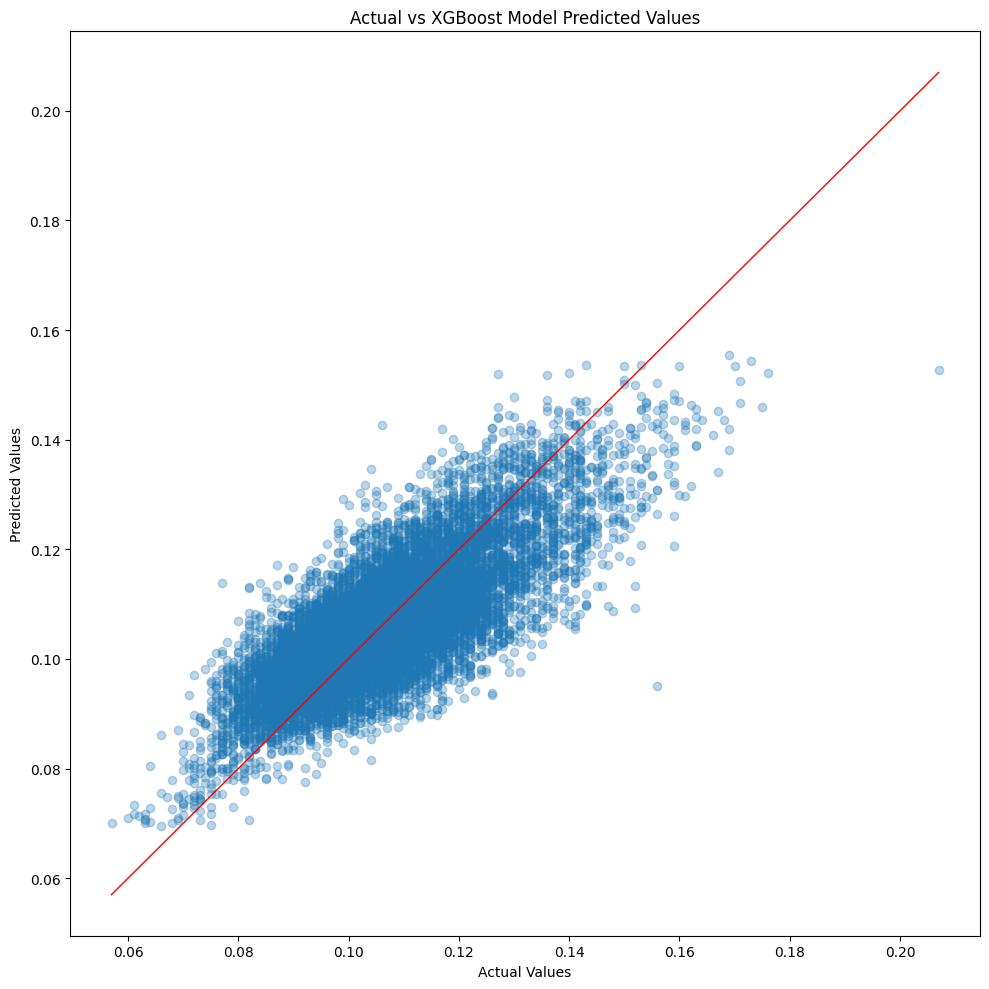

In [31]:
# Actual vs XGBoost Model Predicted Values
plt.figure(figsize=(10, 10))
plt.scatter(y_test, xgb_pred, alpha=0.3)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r-', lw=1)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs XGBoost Model Predicted Values')
plt.tight_layout()
plt.show()

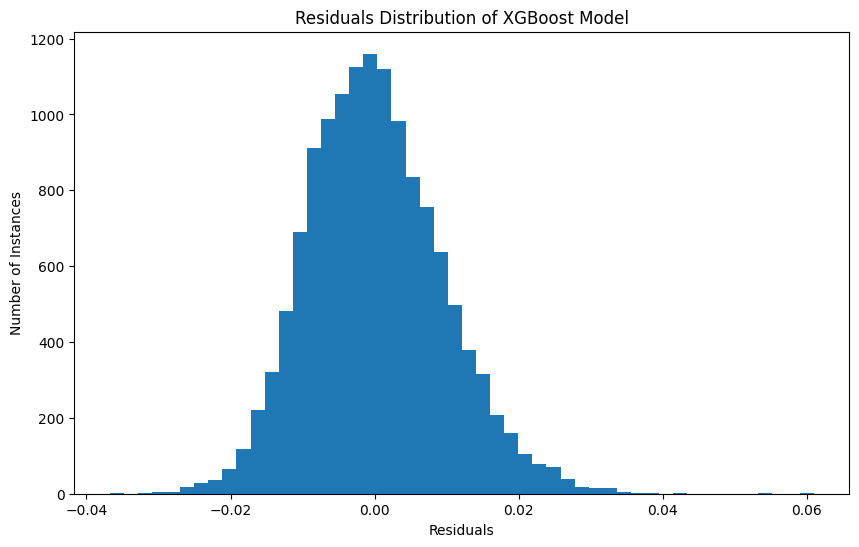

In [32]:
# Distribution of Residuals

residuals = y_test - xgb_pred

plt.figure(figsize=(10, 6))
plt.hist(residuals,bins=50)
plt.xlabel('Residuals')
plt.ylabel('Number of Instances')
plt.title('Residuals Distribution of XGBoost Model')
plt.show()

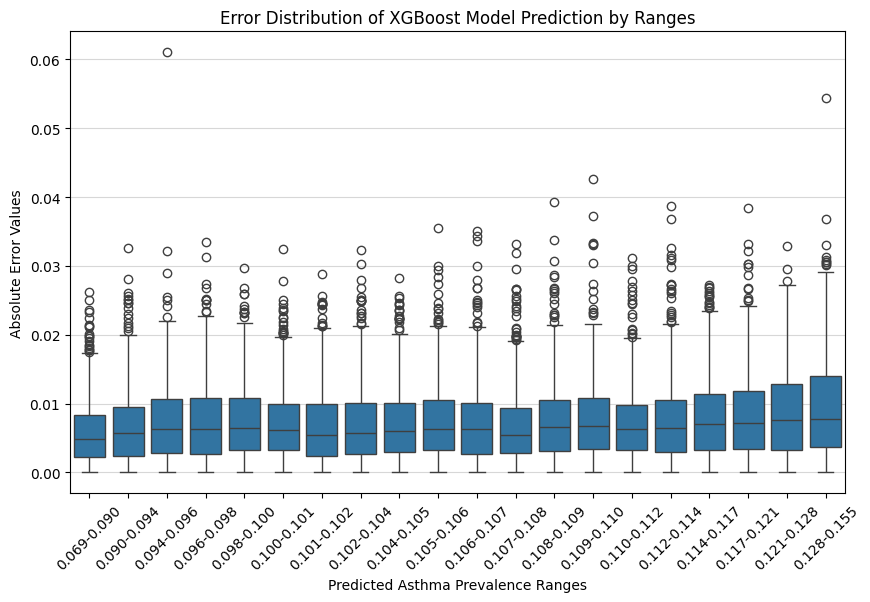

In [33]:
# Error by Prediction Range

xgb_pred_ranges = pd.qcut(xgb_pred, q=20)
range_labels = [f"{i.left:.3f}-{i.right:.3f}" for i in xgb_pred_ranges.categories]
xgb_pred_ranges_labeled = pd.qcut(xgb_pred, q=20, labels=range_labels)

error_by_ranges = pd.DataFrame({
    'Prediction_Range': xgb_pred_ranges_labeled,
    'Absolute_Error': np.abs(residuals)
})
plt.figure(figsize=(10, 6))
sns.boxplot(x='Prediction_Range', y='Absolute_Error', data=error_by_ranges)
plt.xticks(rotation=45)
plt.grid(True, alpha=0.5, axis='y')
plt.xlabel('Predicted Asthma Prevalence Ranges')
plt.ylabel('Absolute Error Values')
plt.title('Error Distribution of XGBoost Model Prediction by Ranges')
plt.show()

### Best Model

The best model is the random forest with 100 estimators on the original data. 

In [34]:
# Apply the random forest on the raw features
# Define features and target
X_full = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc', 
    'countyname', 'FIPS', 'EP_MINRTY'
])
y_full = final_combined_df['asthma_prevalence']

# Fit Random Forest on full dataset
rf_pipeline_full = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

rf_pipeline_full.fit(X_full, y_full)

# Generate predictions
rf_predictions = rf_pipeline_full.predict(X_full)

# Add predictions and delta to original dataframe
final_combined_df['predicted_asthma_prevalence'] = rf_predictions
final_combined_df['delta'] = final_combined_df['asthma_prevalence'] - final_combined_df['predicted_asthma_prevalence']

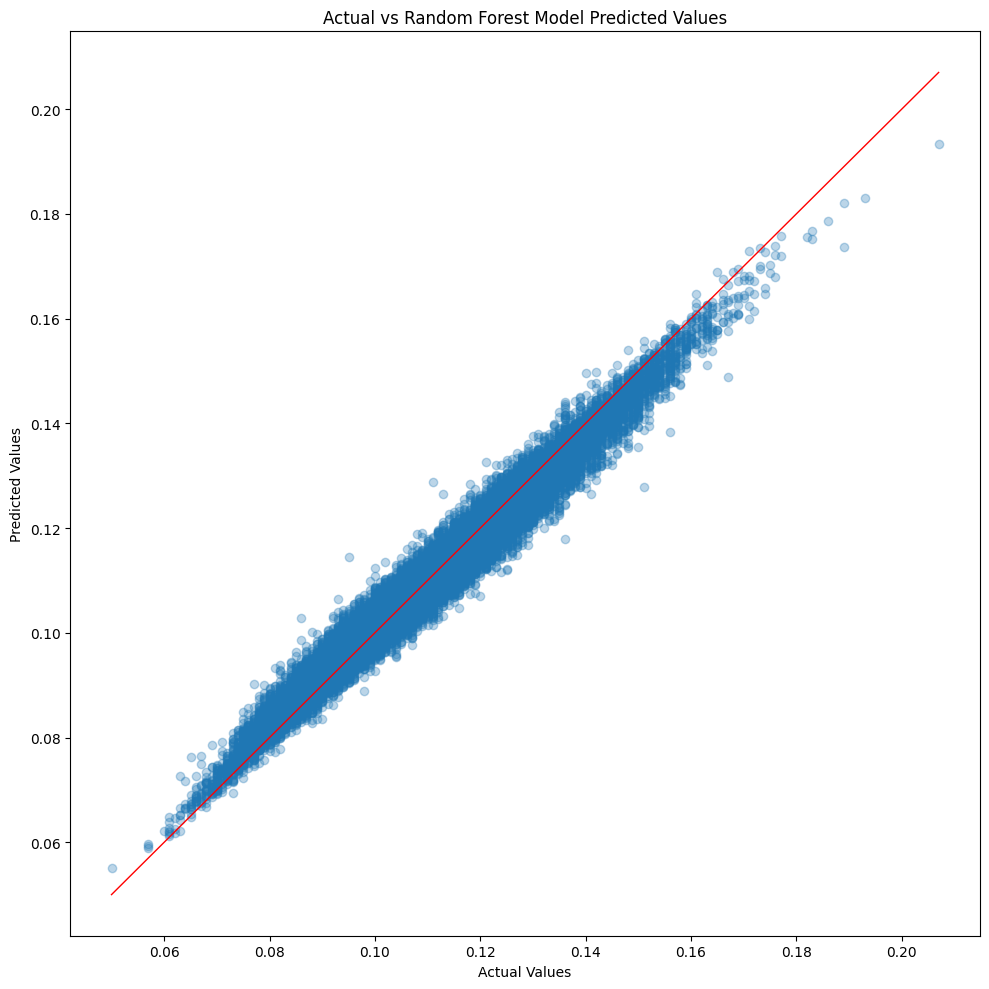

In [35]:
# Figure 9a: Actual versus Random Forest Model Predicted Values

# Actual vs Random Forest Model Predicted Values
plt.figure(figsize=(10, 10))
plt.scatter(y_full, rf_predictions, alpha=0.3)
plt.plot([y_full.min(), y_full.max()], [y_full.min(), y_full.max()], 'r-', lw=1)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Random Forest Model Predicted Values')
plt.tight_layout()
plt.show()

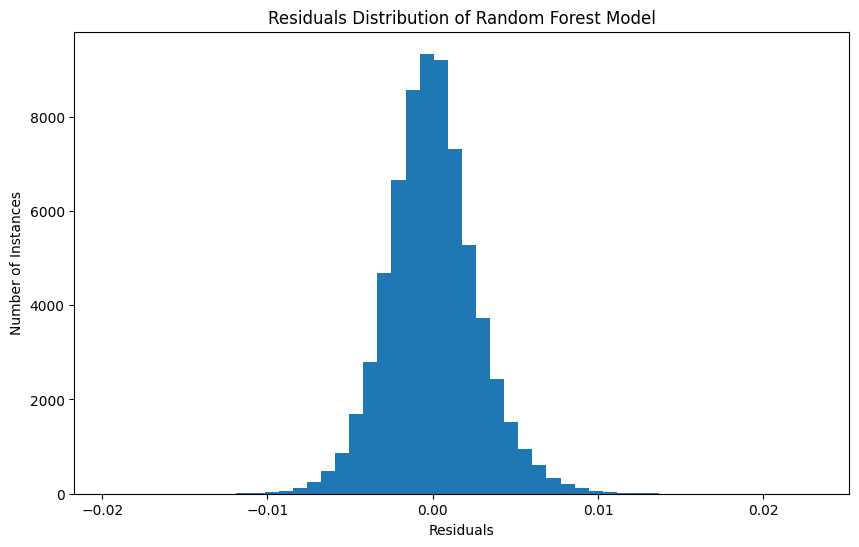

In [36]:
# Distribution of Residuals
residuals = y_full - rf_predictions

plt.figure(figsize=(10, 6))
plt.hist(residuals,bins=50)
plt.xlabel('Residuals')
plt.ylabel('Number of Instances')
plt.title('Residuals Distribution of Random Forest Model')
plt.show()

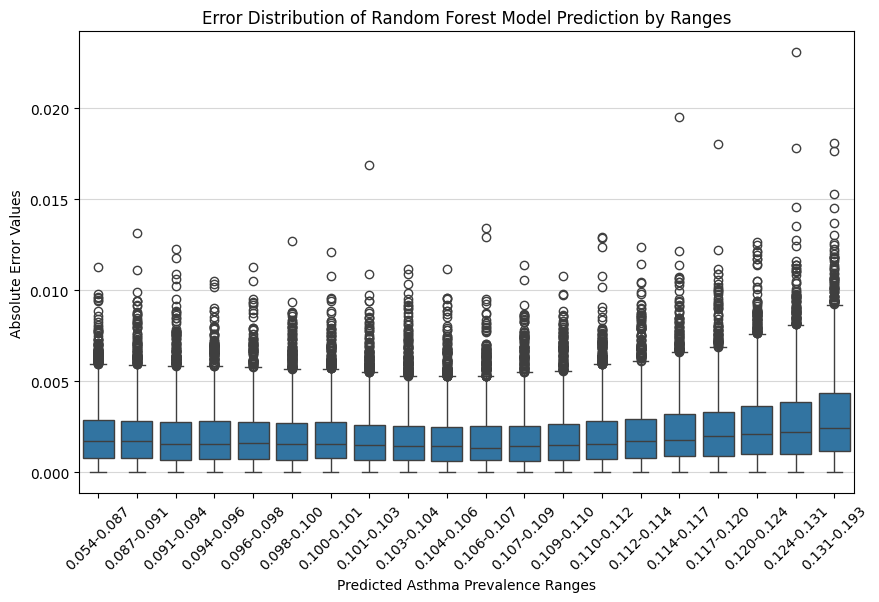

In [37]:
# Error by Prediction Range
rf_pred_ranges = pd.qcut(rf_predictions, q=20)
range_labels = [f"{i.left:.3f}-{i.right:.3f}" for i in rf_pred_ranges.categories]
rf_pred_ranges_labeled = pd.qcut(rf_predictions, q=20, labels=range_labels)

error_by_ranges = pd.DataFrame({
    'Prediction_Range': rf_pred_ranges_labeled,
    'Absolute_Error': np.abs(residuals)
})
plt.figure(figsize=(10, 6))
sns.boxplot(x='Prediction_Range', y='Absolute_Error', data=error_by_ranges)
plt.xticks(rotation=45)
plt.grid(True, alpha=0.5, axis='y')
plt.xlabel('Predicted Asthma Prevalence Ranges')
plt.ylabel('Absolute Error Values')
plt.title('Error Distribution of Random Forest Model Prediction by Ranges')
plt.show()


Random Forest with Original Features (5-Fold CV):
Mean MAE: 0.00563
Mean R²: 0.75335


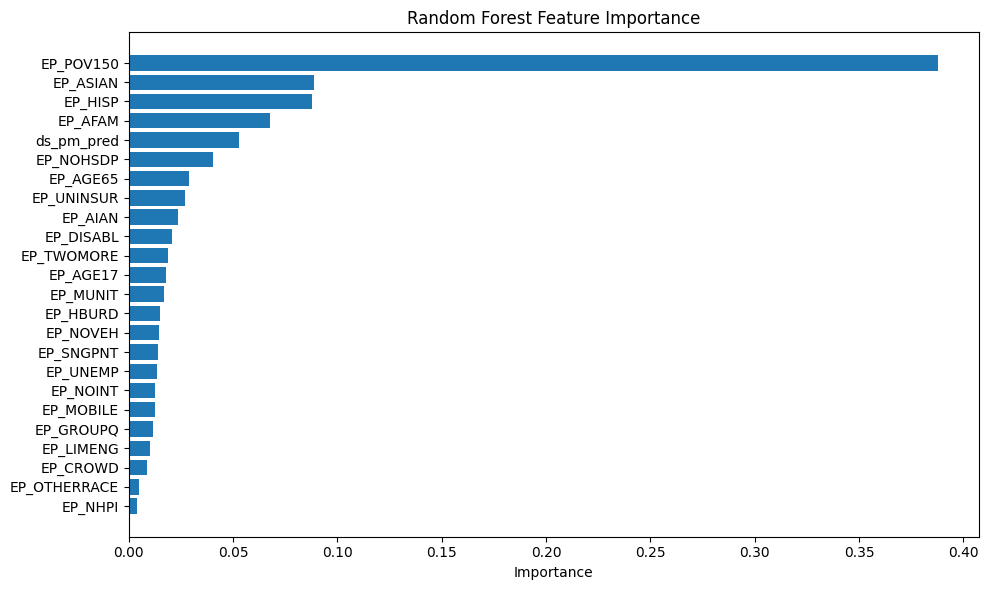

,Ablation,MAE,R2,MAE_Change,R2_Change
0,Baseline (All Features),0.005627,0.753348,0.000000,0.000000
1,No EP_POV150,0.006117,0.708680,0.000489,-0.044667
2,No Racial Features,0.006582,0.664558,0.000955,-0.088790


In [38]:
# Figure 10: Feature Importance

# Feature Importance and Ablation

# Data preparation
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc',
    'countyname', 'FIPS', 'Cluster', 'Community', 'EP_MINRTY', 
    'predicted_asthma_prevalence', 'delta'
])
y = final_combined_df['asthma_prevalence']
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Baseline model training
rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])
rf_mae_scores = -cross_val_score(rf_pipeline, X, y, scoring='neg_mean_absolute_error', cv=cv)
rf_r2_scores = cross_val_score(rf_pipeline, X, y, scoring='r2', cv=cv)

print("\nRandom Forest with Original Features (5-Fold CV):")
print(f"Mean MAE: {rf_mae_scores.mean():.5f}")
print(f"Mean R²: {rf_r2_scores.mean():.5f}")

# Calculate feature importance
rf_pipeline.fit(X, y)
rf_model = rf_pipeline.named_steps['model']
importances = rf_model.feature_importances_
features = X.columns

feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.title('Random Forest Feature Importance')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Targeted ablation
# Define which race-related features to remove
race_features_list = [
    'EP_AFAM', 'EP_AIAN', 'EP_ASIAN', 'EP_HISP',  
    'EP_NHPI', 'EP_OTHERRACE', 'EP_TWOMORE'
]
race_features = [col for col in X.columns if col in race_features_list]

# Function to compute ablation scores
def ablate_and_score(X_ablate, label):
    scores = cross_validate(
        Pipeline([
            ('scaler', StandardScaler()),
            ('model', RandomForestRegressor(n_estimators=100, random_state=42))
        ]),
        X_ablate, y,
        scoring={'mae': 'neg_mean_absolute_error', 'r2': 'r2'},
        cv=cv, n_jobs=-1
    )
    return {
        'Ablation': label,
        'MAE': -scores['test_mae'].mean(),
        'R2': scores['test_r2'].mean()
    }

# Run targeted ablations
X_no_pov = X.drop(columns=['EP_POV150']) if 'EP_POV150' in X.columns else X
X_no_race = X.drop(columns=race_features) if race_features else X

targeted_ablation = [
    {'Ablation': 'Baseline (All Features)', 'MAE': rf_mae_scores.mean(), 'R2': rf_r2_scores.mean()},
    ablate_and_score(X_no_pov, 'No EP_POV150'),
    ablate_and_score(X_no_race, 'No Racial Features')
]

targeted_ablation_df = pd.DataFrame(targeted_ablation)
targeted_ablation_df['MAE_Change'] = targeted_ablation_df['MAE'] - rf_mae_scores.mean()
targeted_ablation_df['R2_Change'] = targeted_ablation_df['R2'] - rf_r2_scores.mean()

targeted_ablation_df

In [39]:
# Feature Importance Table for Appendix
# Display feature importances
feature_importance_df

,Feature,Importance
0,EP_POV150,0.388074
18,EP_ASIAN,0.088923
17,EP_HISP,0.087860
16,EP_AFAM,0.067848
23,ds_pm_pred,0.052606
3,EP_NOHSDP,0.040222
5,EP_AGE65,0.028625
4,EP_UNINSUR,0.026873
19,EP_AIAN,0.023536
7,EP_DISABL,0.020727


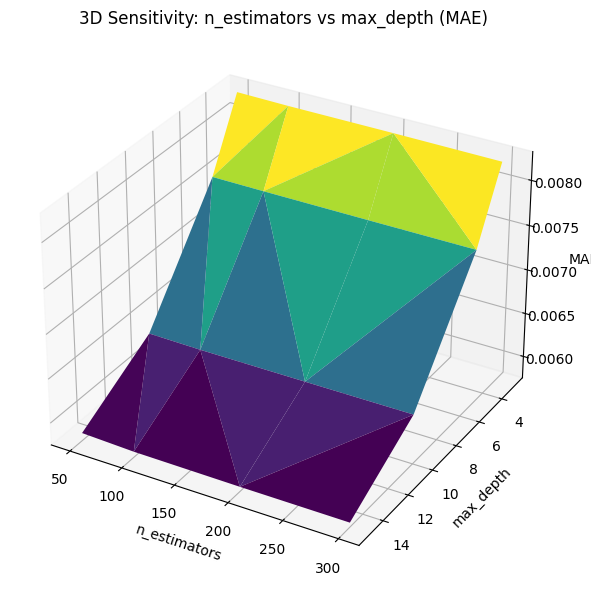

,n_estimators,max_depth,MAE
0,50,3,0.008264
1,50,5,0.007524
2,50,10,0.006324
3,50,15,0.005835
4,100,3,0.008256
5,100,5,0.007518
6,100,10,0.006314
7,100,15,0.005812
8,200,3,0.008253
9,200,5,0.007513


In [40]:
# Figure 11: 3D MAE Sensitivity on # Estimators and Max Depth

# Sensitivity Analysis

# Data preparation
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc',
    'countyname', 'FIPS', 'Cluster', 'Community', 'EP_MINRTY', 
    'predicted_asthma_prevalence', 'delta'
])
y = final_combined_df['asthma_prevalence']

# Parameter ranges
n_estimators_range = [50, 100, 200, 300]
max_depth_range = [3, 5, 10, 15]

cv = KFold(n_splits=3, shuffle=True, random_state=42)

# Run grid and collect MAE
results = []

for n in n_estimators_range:
    for d in max_depth_range:
        pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('model', RandomForestRegressor(
                n_estimators=n, max_depth=d, random_state=42, n_jobs=-1
            ))
        ])
        mae = -cross_val_score(pipeline, X, y, scoring='neg_mean_absolute_error', cv=cv).mean()
        results.append((n, d, mae))

# Convert to DataFrame
results_df = pd.DataFrame(results, columns=['n_estimators', 'max_depth', 'MAE'])

# 3D plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

X_vals = results_df['n_estimators']
Y_vals = results_df['max_depth']
Z_vals = results_df['MAE']

ax.plot_trisurf(X_vals, Y_vals, Z_vals, cmap='viridis', edgecolor='none')
ax.set_xlabel('n_estimators')
ax.set_ylabel('max_depth')
ax.set_zlabel('MAE')
ax.set_title('3D Sensitivity: n_estimators vs max_depth (MAE)')

ax.invert_yaxis()

plt.tight_layout()
plt.show()

results_df


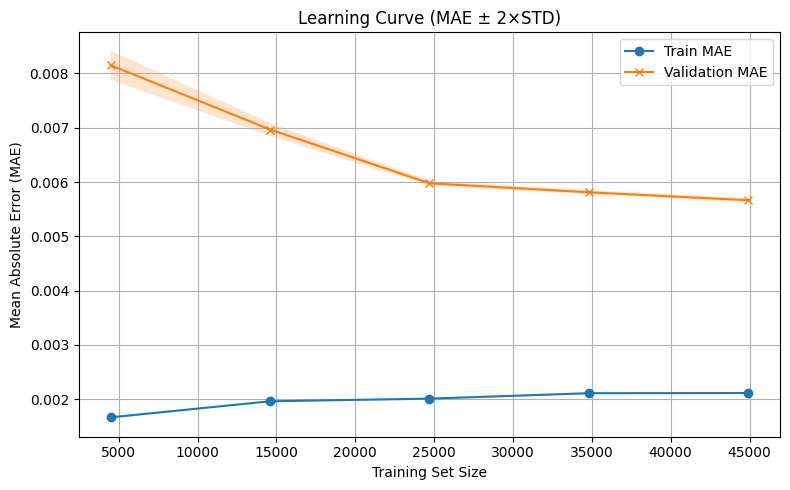

,train_size,train_mae,val_mae
0,4491,0.001667,0.008151
1,14596,0.001962,0.006968
2,24701,0.002011,0.005978
3,34806,0.002111,0.005812
4,44912,0.002114,0.005665


In [41]:
# Figure 12: Learning Curve for Optimal Performance

# Learning Curve
# Data preparation
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc',
    'countyname', 'FIPS', 'Cluster', 'Community', 'EP_MINRTY', 
    'predicted_asthma_prevalence', 'delta'
])
y = final_combined_df['asthma_prevalence']

# Define pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

# Define CV and training seizes
cv = KFold(n_splits=3, shuffle=True, random_state=42)
train_sizes = np.linspace(0.1, 1.0, 5)

# Learning curve calculation
train_sizes_mae, train_scores_mae, val_scores_mae = learning_curve(
    pipeline, X, y, cv=cv,
    scoring=make_scorer(mean_absolute_error, greater_is_better=False),
    train_sizes=train_sizes, n_jobs=-1
)

# Convert negative MAE to positive 
train_scores_mae = -train_scores_mae
val_scores_mae = -val_scores_mae

# Compute means and stds 
train_mean = np.mean(train_scores_mae, axis=1)
train_std = np.std(train_scores_mae, axis=1)

val_mean = np.mean(val_scores_mae, axis=1)
val_std = np.std(val_scores_mae, axis=1)

# Plotting with scaled error bands
plt.figure(figsize=(8, 5))
scale = 2  # Scale error bands to ±2 standard deviations

# Train curve
plt.plot(train_sizes_mae, train_mean, label="Train MAE", marker='o')
plt.fill_between(train_sizes_mae,
                 train_mean - scale * train_std,
                 train_mean + scale * train_std,
                 alpha=0.2)

# Validation curve
plt.plot(train_sizes_mae, val_mean, label="Validation MAE", marker='x')
plt.fill_between(train_sizes_mae,
                 val_mean - scale * val_std,
                 val_mean + scale * val_std,
                 alpha=0.2)

# Labels and styling
plt.xlabel("Training Set Size")
plt.ylabel("Mean Absolute Error (MAE)")
plt.title("Learning Curve (MAE ± 2×STD)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Put learning curve values in df and display df
learning_curve_df = pd.DataFrame({
    'train_size': train_sizes_mae,
    'train_mae': train_mean,
    'val_mae': val_mean
})
learning_curve_df

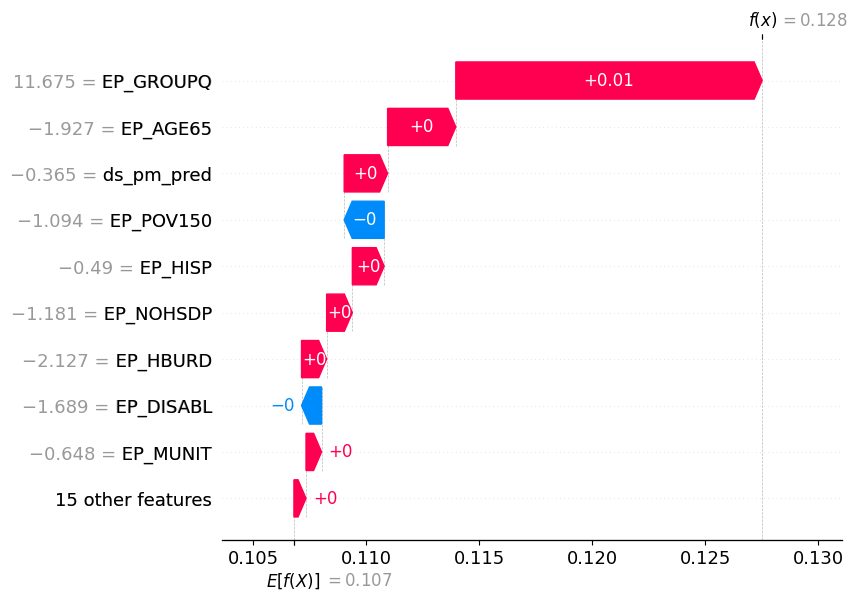

,feature,value,shap_value
0,EP_GROUPQ,11.675083,0.013555
1,EP_AGE65,-1.926783,0.003017
2,ds_pm_pred,-0.365159,0.001922
3,EP_POV150,-1.093690,-0.001768
4,EP_HISP,-0.490412,0.001407
5,EP_NOHSDP,-1.180940,0.001137
6,EP_HBURD,-2.127166,0.001111
7,EP_DISABL,-1.688801,-0.000887
8,EP_MUNIT,-0.647890,0.000689
9,EP_AFAM,-0.379863,-0.000594


In [42]:
# Figure 13: Failure Case #1 - Large Prediction Error

# Failure Analysis - Largest Error
# Prepare data 
X = final_combined_df.drop(columns=[
    'asthma_prevalence', 'Region', 'stateabbr', 'statedesc',
    'countyname', 'FIPS', 'Cluster', 'Community', 'EP_MINRTY',
    'predicted_asthma_prevalence', 'delta', 'abs_error'
], errors='ignore')
y = final_combined_df['asthma_prevalence']

# Fit model pipeline
rf_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])
rf_pipeline.fit(X, y)

# Predict and compute error 
scaler = rf_pipeline.named_steps['scaler']
model = rf_pipeline.named_steps['model']
X_scaled = scaler.transform(X)

final_combined_df['predicted_asthma_prevalence'] = rf_pipeline.predict(X)
final_combined_df['delta'] = final_combined_df['asthma_prevalence'] - final_combined_df['predicted_asthma_prevalence']
final_combined_df['abs_error'] = final_combined_df['delta'].abs()

# Get row with largest absolute error
worst_idx = final_combined_df['abs_error'].idxmax()
x_row = X_scaled[worst_idx:worst_idx + 1]

# Compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_row)

# Build Explanation and plot
shap_explanation = shap.Explanation(
    values=shap_values[0],
    base_values=explainer.expected_value[0] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value,
    data=x_row[0],
    feature_names=scaler.feature_names_in_
)

fig = plt.figure()  # Force clean figure
shap.plots.waterfall(shap_explanation)

# Format label precision
for text in plt.gca().texts:
    try:
        val = float(text.get_text().replace("+", "").replace("−", "-"))
        text.set_text(f"{val:+.4f}")
    except ValueError:
        continue

# Final cleanup to suppress extra box
plt.close("all")           # This is the kill switch
from IPython.display import HTML, display
display(HTML(""))          # Prevents unwanted output in notebooks

# Convert SHAP explanation to DataFrame
shap_df = pd.DataFrame({
    'feature': shap_explanation.feature_names,
    'value': shap_explanation.data,
    'shap_value': shap_explanation.values
})

# Display the SHAP values in descending order of impact
shap_df['abs_shap'] = shap_df['shap_value'].abs()
shap_df = shap_df.sort_values('abs_shap', ascending=False).drop(columns='abs_shap')

shap_df.reset_index(drop=True, inplace=True)
shap_df

Average absolute error by poverty quartile:
 poverty_quartile
0    0.001944
1    0.002003
2    0.002044
3    0.002292
Name: abs_error, dtype: float64
Worst-case index in Q3: 12218


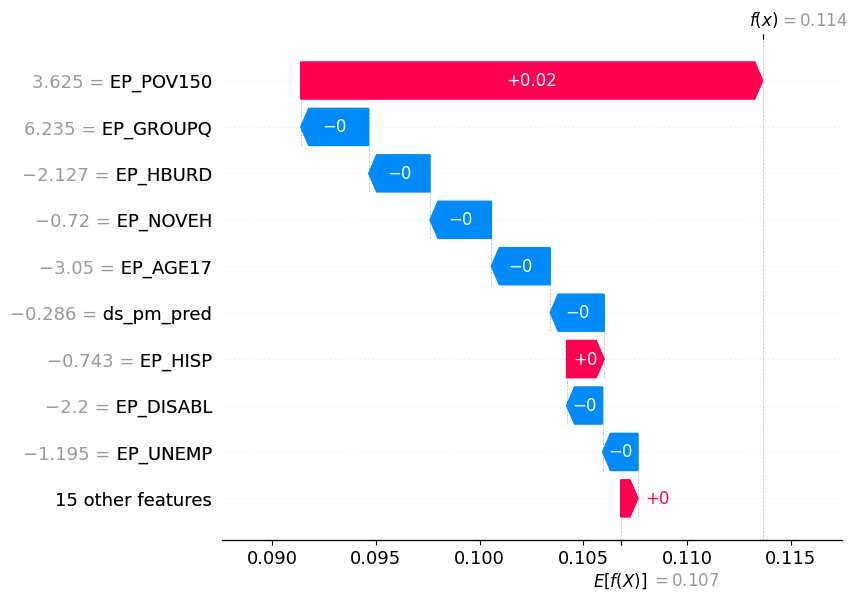

,feature,value,shap_value
0,EP_POV150,3.624973,0.022272
1,EP_GROUPQ,6.234906,-0.003275
2,EP_HBURD,-2.127166,-0.002957
3,EP_NOVEH,-0.719886,-0.002955
4,EP_AGE17,-3.049962,-0.002839
5,ds_pm_pred,-0.286036,-0.002604
6,EP_HISP,-0.743210,0.001815
7,EP_DISABL,-2.199635,-0.001733
8,EP_UNEMP,-1.194628,-0.001709
9,EP_NOHSDP,4.562369,0.001669


In [43]:
# Figure 14: Failure Case #2 - Systemic Bias

# Failure Analysis - Systemic Bias by Poverty Quartile
# Create poverty quartiles
final_combined_df['poverty_quartile'] = pd.qcut(final_combined_df['EP_POV150'], 4, labels=False)

# Compute average error per quartile
group_error = final_combined_df.groupby('poverty_quartile')['abs_error'].mean()
print("Average absolute error by poverty quartile:\n", group_error)

# Identify worst-case row in Q3 (highest poverty)
high_poverty_df = final_combined_df[final_combined_df['poverty_quartile'] == 3]
worst_idx = high_poverty_df['abs_error'].idxmax()
print(f"Worst-case index in Q3: {worst_idx}")

# Extract and scale row
scaler = rf_pipeline.named_steps['scaler']
model = rf_pipeline.named_steps['model']
X_scaled = scaler.transform(final_combined_df[scaler.feature_names_in_])
x_row = X_scaled[worst_idx:worst_idx + 1]

# Compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(x_row)

# Build Explanation and plot
shap_explanation = shap.Explanation(
    values=shap_values[0],
    base_values=explainer.expected_value[0] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value,
    data=x_row[0],
    feature_names=scaler.feature_names_in_
)

shap.plots.waterfall(shap_explanation)

# Format label precision
for text in plt.gca().texts:
    try:
        val = float(text.get_text().replace("+", "").replace("−", "-"))
        text.set_text(f"{val:+.4f}")
    except ValueError:
        continue

# Final cleanup to suppress extra box
plt.close("all")           # This is the kill switch
from IPython.display import HTML, display
display(HTML(""))          # Prevents unwanted output in notebooks

# Convert SHAP explanation to DataFrame
shap_df = pd.DataFrame({
    'feature': shap_explanation.feature_names,
    'value': shap_explanation.data,
    'shap_value': shap_explanation.values
})

# Display the SHAP values in descending order of impact
shap_df['abs_shap'] = shap_df['shap_value'].abs()
shap_df = shap_df.sort_values('abs_shap', ascending=False).drop(columns='abs_shap')

shap_df.reset_index(drop=True, inplace=True)
shap_df

Outlier case:
asthma_prevalence                0.092
predicted_asthma_prevalence    0.09361
abs_error                      0.00161
Name: 64070, dtype: object


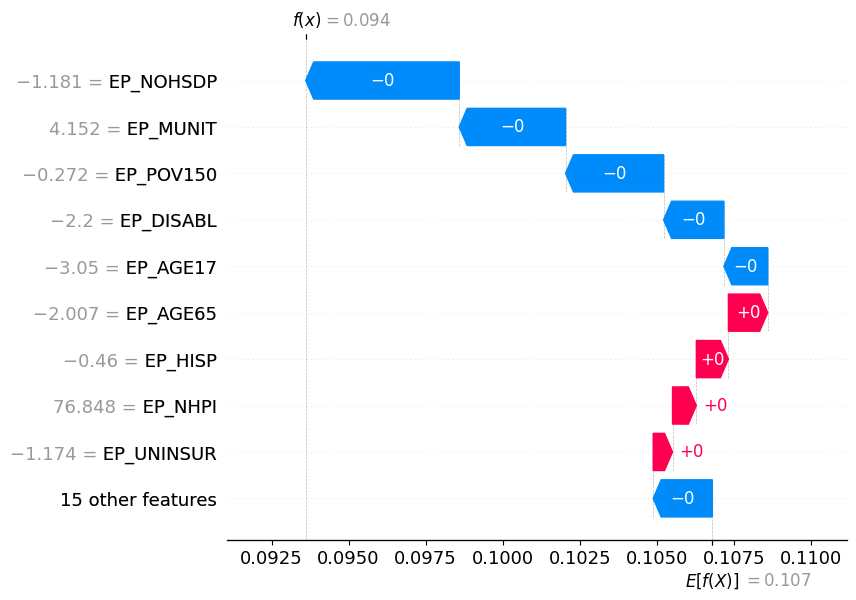

,feature,value,shap_value
0,EP_NOHSDP,-1.180940,-0.004980
1,EP_MUNIT,4.151853,-0.003450
2,EP_POV150,-0.271600,-0.003181
3,EP_DISABL,-2.199635,-0.001957
4,EP_AGE17,-3.049962,-0.001422
5,EP_AGE65,-2.007183,0.001275
6,EP_HISP,-0.460076,0.001040
7,EP_NHPI,76.848422,0.000773
8,EP_UNINSUR,-1.174370,0.000627
9,EP_SNGPNT,-1.125829,-0.000595


In [44]:
# Failure Analysis - Outlier Case
# Convert scaled matrix to DataFrame
X_scaled_df = pd.DataFrame(X_scaled, columns=scaler.feature_names_in_)

column_to_drop = "poverty_quartile"
X_scaled_df.drop(columns=column_to_drop, inplace=True, errors='ignore')

# Compute z-score sum
X_scaled_df['zscore_sum'] = X_scaled_df.apply(zscore, axis=0).abs().sum(axis=1)

# Identify most extreme row
outlier_idx = X_scaled_df['zscore_sum'].idxmax()

# Show error values
print("Outlier case:")
print(final_combined_df.loc[outlier_idx, ['asthma_prevalence', 'predicted_asthma_prevalence', 'abs_error']])

# Compute SHAP values
x_row = X_scaled[outlier_idx:outlier_idx + 1]
shap_values = explainer.shap_values(x_row)

# Build Explanation and plot
shap_explanation = shap.Explanation(
    values=shap_values[0],
    base_values=explainer.expected_value[0] if isinstance(explainer.expected_value, (list, np.ndarray)) else explainer.expected_value,
    data=x_row[0],
    feature_names=scaler.feature_names_in_
)

# Plot the SHAP explanation
shap.plots.waterfall(shap_explanation)

# Format label precision
for text in plt.gca().texts:
    try:
        val = float(text.get_text().replace("+", "").replace("−", "-"))
        text.set_text(f"{val:+.4f}")
    except ValueError:
        continue

# Final cleanup to suppress extra box
plt.close("all")           # This is the kill switch
from IPython.display import HTML, display
display(HTML(""))          # Prevents unwanted output in notebooks

# Convert SHAP explanation to DataFrame
shap_df = pd.DataFrame({
    'feature': shap_explanation.feature_names,
    'value': shap_explanation.data,
    'shap_value': shap_explanation.values
})

# Display the SHAP values in descending order of impact
shap_df['abs_shap'] = shap_df['shap_value'].abs()
shap_df = shap_df.sort_values('abs_shap', ascending=False).drop(columns='abs_shap')

shap_df.reset_index(drop=True, inplace=True)
shap_df

## Visualizations

### Asthma Prevalence Distribution

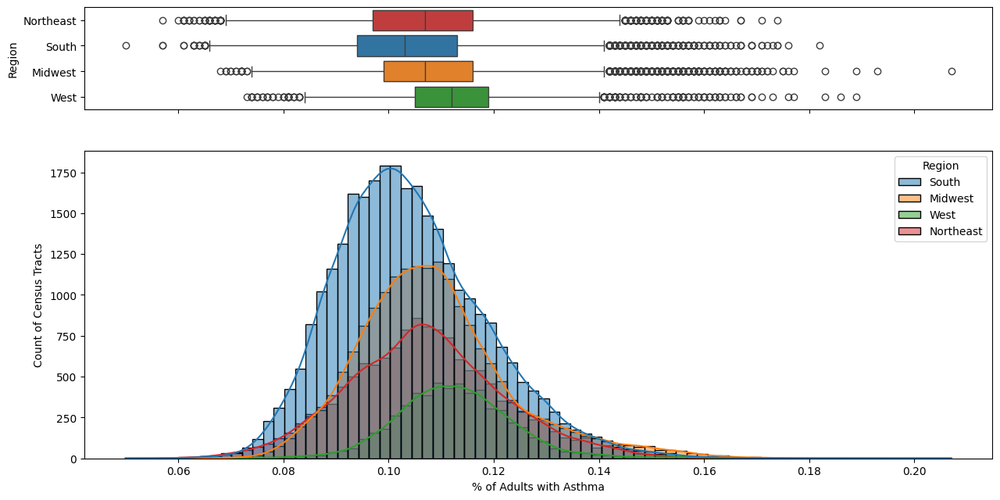

In [45]:
# Corrected code to show the distribution of asthma prevalence at the census tract-level by region
order_list = ['Northeast', 'South', 'Midwest', 'West']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.25, .75)}, figsize=(15,7.5))

# Histogram plot with seaborn
sns.histplot(data=final_combined_df, x="asthma_prevalence", hue="Region", kde=True, ax=ax_hist, binwidth=0.002)

# Boxplot for display
sns.boxplot(x="asthma_prevalence", y="Region", hue="Region", data=final_combined_df, ax=ax_box, order=order_list)

# Customizing patch colors and handles for the boxplot
for i, patch in enumerate(ax_box.artists):
    col = patch.get_facecolor()
    patch.set_edgecolor(col)
    patch.set_facecolor('None')

    for j in range(i * 6, i * 6 + 6):
        line = ax_box.lines[j]
        line.set_color(col)
        line.set_mfc(col)
        line.set_mec(col)

# Adding labels
plt.xlabel('% of Adults with Asthma')
plt.ylabel('Count of Census Tracts')

# Show the plot
plt.show()

## Choropleth Maps Based on Model Predictions

In [46]:
# Choropleth Map with Plotly
# Reference: https://plotly.com/python/choropleth-maps/

# US counties GeoJSON mapping
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

# Extract county FIPS codes from census tract FIPS codes
final_combined_df['FIPS'] = final_combined_df['FIPS'].astype(str).str[:5]

# Aggregate (mean) data by county FIPS (since multiple tracts can belong to same county)
county_df = final_combined_df.groupby('FIPS').agg({
    'predicted_asthma_prevalence': 'mean',
    'asthma_prevalence': 'mean',
    'delta': 'mean'
}).reset_index()


# Function to create choropleth map
def choropleth_map(df,field,title_name,color_continuous='Viridis'):
    fig = px.choropleth(
        df,
        geojson=counties,
        locations='FIPS',
        locationmode='geojson-id',
        color=field,
        scope="usa",
        color_continuous_scale=color_continuous,
        range_color=(df[field].min(), 
                    df[field].max()),
        title=title_name
    )

    fig.update_layout(
        title_x=0.5,
        title_y=0.85,
        geo=dict(
            showlakes=True,
            lakecolor='rgb(255, 255, 255)'
        ),
        width=1200,
        height=800
    )

    # Show the map
    fig.show()


# Choropleth Map with Predicted Asthma Prevalence
choropleth_map(county_df,'predicted_asthma_prevalence','Predicted Asthma Prevalence')

# Choropleth Map with Actual Asthma Prevalence
choropleth_map(county_df,'asthma_prevalence','Actual Asthma Prevalence')

In [47]:
# Choropleth Map with Delta between Actual and Predicted Asthma Prevalence
choropleth_map(county_df,'delta','Delta between Actual and Predicted Asthma Prevalence','icefire')

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=32f7fcbd-ed69-45a9-89b9-6a8497955dec' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>